In [1]:
import seaborn as sns
import pandas as pd
import numpy as np 
from matplotlib import pyplot as plt

# settings
%load_ext autoreload
%autoreload 2
sns.set_context("talk")

DATA_PATH = "/Users/jessbreda/Desktop/github/jbreda_animal_training/data/meetings/"

# Google Slides [Summary] of Results 


# 1. Read in Raw Data & Wrangle

In [2]:
df = pd.read_csv(DATA_PATH + "2024_04_29_JC_meeting.csv")

/var/folders/__/8jn6qz211155h1xb451s5zcr0000gn/T/ipykernel_46318/1345217217.py:1: DtypeWarning: Columns (54,69,70,71,74,82,87,89,95) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(DATA_PATH + "2024_04_29_JC_meeting.csv")


### 1.1 Initial Wrangle

In [3]:
df = df.drop_duplicates(keep="first")  # C animals are accidentally accounted for twice

#### 1.1.1 Drop Go Guide Stages



Filter data from previous go guide curriculum that also had center poiking 
based on sessions table, this ended on 2023-08-25 for the three animals I tried
it with and they all went back to side poking stage 3

In [4]:
go_guide_date_min = "2023-08-25"
go_guide_animals = ["R010", "R011", "R012"]
df.query("animal_id in @go_guide_animals and date > @go_guide_date_min")

# Create boolean masks
mask_go_guide = (df["animal_id"].isin(go_guide_animals)) & (
    df["date"] > go_guide_date_min
)
mask_other_animals = ~df["animal_id"].isin(go_guide_animals)

# Combine masks to retain all data
combined_mask = mask_go_guide | mask_other_animals

df = df[combined_mask]

#### 1.1.2 Adjust R036 start date



R036 had a bad rig or something and started in stage 5 before going back to spoking and switching rigs. I want to remove the sessions before spoking because they are not representative of this animals performance in this stage. In the plot below you can see this gap that occurs when filtering for stages > 5 and plotting the fixation dur.

![image.png](attachment:image.png)

In [18]:
animal_to_adjust = ["R036"]
adjusted_start_date = "2024-01-22"

# Create boolean masks
mask_r036 = (df["animal_id"].isin(animal_to_adjust)) & (
    df["date"] >= adjusted_start_date
)
mask_other_animals = ~df["animal_id"].isin(animal_to_adjust)

# Combine masks to retain all data
combined_mask = mask_r036 | mask_other_animals

df = df[combined_mask]

#### 1.1.3 Remove R038 from Analaysis



This animal had some issue with the df saving- appears to start fixation at stage 8 and this is incorrect given the data in the sessions table. Dropping from analysis.

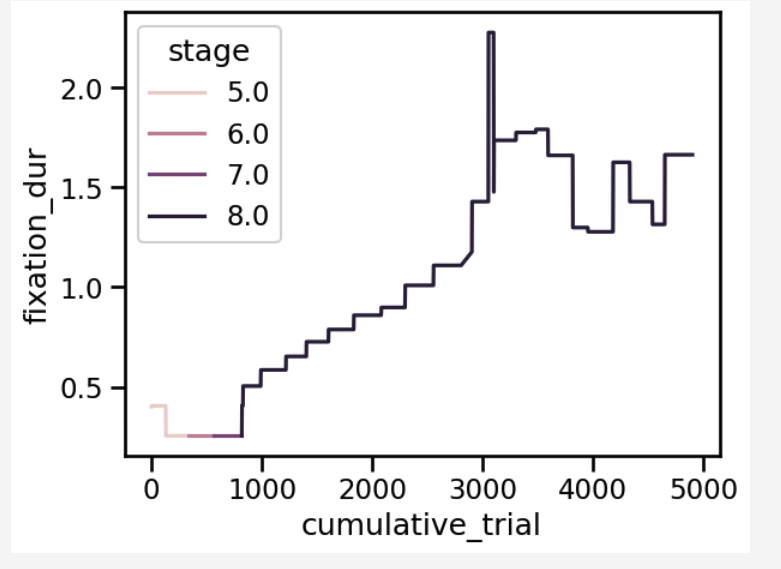

In [39]:
df = df.query("animal_id != 'R038'").copy()

### 1.2 Assess Features



Below, we can see that the delay dur is a bit complicated in this scenario. When in stages 5-7 (fixation growing, no violation penalty), the delay dur is parameterized by the settling_in_dur. This allows the animal to rapidly retry without penalty.

In stages 8 and above, the delay dur is parameterized by the pre_go_dur. This does not take into account the settling_in_dur explicitly when the stimuli are off (stage 8 only).

In stage 8, then, the required fixation time is the pre_go_dur + the settling_in_dur. In stage 9 onward (when stimuli are on), pre_go_dur takes into account settling_in_dur. Training section [here](https://github.com/Brody-Lab/Protocols/blob/master/%40DMS2/TS_JB_r_classic.m#L598) and Shaping Section [here](https://github.com/Brody-Lab/Protocols/blob/master/%40DMS2/ShapingSection.m#L1585)

[Text(0, 0.5, 'Delay Time'),
 Text(0.5, 0, 'Trial'),
 Text(0.5, 1.0, 'Settling in Dur Stage 5-8 for R020')]

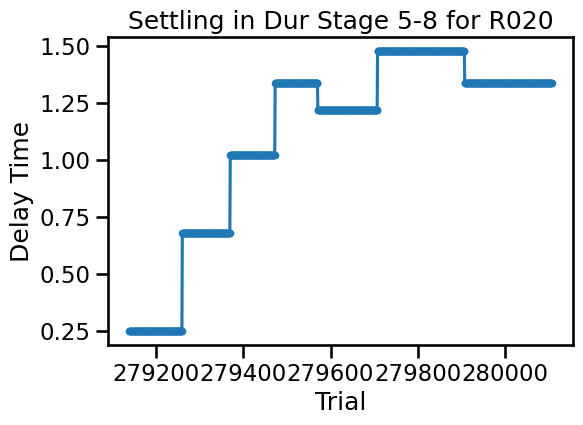

In [19]:
single_animal = "R020"
subdf = df.query("animal_id == @single_animal and stage >=5 and stage<8")
fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(subdf.settling_in_dur, marker=".")
ax.set(
    ylabel="Delay Time",
    xlabel="Trial",
    title=f"Settling in Dur Stage 5-8 for {single_animal}",
)

[Text(0, 0.5, 'Delay Time'),
 Text(0.5, 0, 'Trial'),
 Text(0.5, 1.0, 'Pre Go Dur Stage 5-9 for R020')]

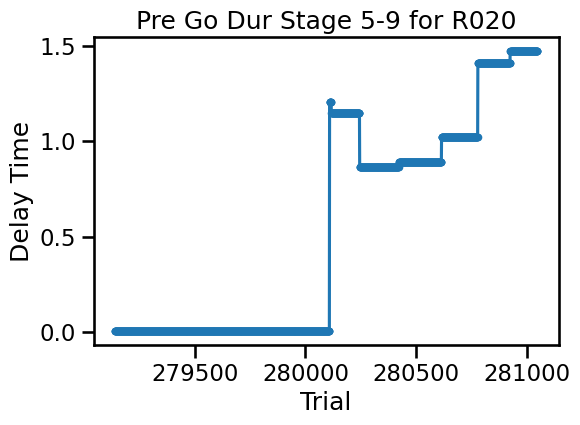

In [20]:
single_animal = "R020"
subdf = df.query("animal_id == @single_animal and stage >=5 and stage<9")
fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(subdf.pre_go_dur, marker=".")

ax.set(
    ylabel="Delay Time",
    xlabel="Trial",
    title=f"Pre Go Dur Stage 5-9 for {single_animal}",
)

## 1.3. Wrangle into a processed df ("tdf")




1. Reduce size of data frame by removing columns that are not needed and stages that are not needed

In [25]:
columns_of_interest = [
    "trial",
    "animal_id",
    "date",
    "sess_id",
    "hits",
    "violations",
    "stage",
    "sa",
    "sb",
    "stimuli_on",
    "settling_in_dur",
    "legal_cbreak_dur",
    "pre_dur",
    "adj_pre_dur",
    "stimulus_dur",
    "delay_dur",
    "post_dur",
    "sb_extra_dur",
    "viol_off_dur",
    "pre_go_dur",
    "sound_pair",
    "give_type_imp",
    "give_frac",
    "n_settling_ins",
    "avg_settling_in",
    "cpoke_dur",
]

tdf = df.query("stage >=5 and stage <= 11")[columns_of_interest].copy()

2. Make relative start date plots and count trials


In [26]:
tdf["date_time_date"] = pd.to_datetime(tdf["date"], format="%Y-%m-%d")
tdf["session"] = tdf.groupby("animal_id")["date_time_date"].transform(
    lambda x: (x - x.min()).dt.days + 1
)
tdf["cumulative_trial"] = tdf.groupby("animal_id").cumcount() + 1

3. Compute accurate fixation duration given stage requirements above

In [27]:
def determine_fixation_dur(row):
    if row["stage"] in (5, 6, 7, 8):
        if (
            row["session"] == 1 and row["cumulative_trial"] == 1
        ):  # pre go is sometimes set to 0.45
            return row.settling_in_dur
        else:
            return row.settling_in_dur + row.pre_go_dur
    elif row["stage"] >= 9:
        return row.pre_go_dur  # settling in dur now accounted for in pre_go_dur
    else:
        KeyError("Stage not found")


tdf["fixation_dur"] = tdf.apply(determine_fixation_dur, axis=1)

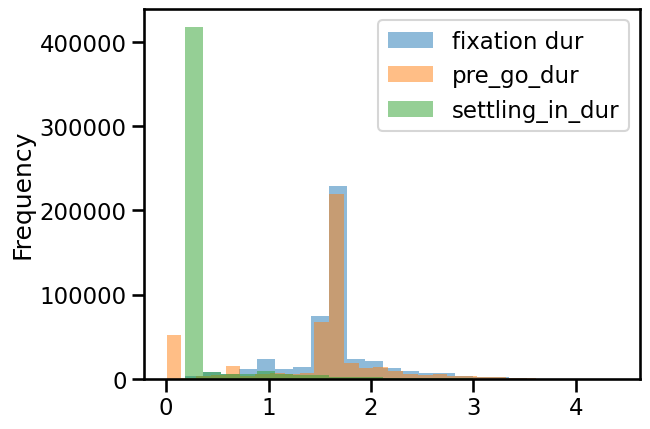

In [28]:
tdf.fixation_dur.plot(kind="hist", bins=25, label="fixation dur", alpha=0.5)
tdf.pre_go_dur.plot(kind="hist", bins=25, label="pre_go_dur", alpha=0.5)
tdf.settling_in_dur.plot(kind="hist", bins=25, label="settling_in_dur", alpha=0.5)
plt.legend()

## 1.4 Save Out


In [41]:
save_name = "processed_df.csv"
save_path = "/Users/jessbreda/Desktop/github/jbreda_animal_training/data/analyses/fixation_experiment"

In [ ]:

tdf.to_csv(save_path + save_name, index=False)

Generally, fixation dur is quite similar to the pro go dur distribution. However, because it also includes settling in dur, it is a bit lower. Most trials happen in the 1.4-1.6 range as this is what occurs in stage 10, 11.

## 2 Plots

* raw fixation dur over trials (focusing on stages 5-8)

* raw required vs actual dur over trials 

* fixation time max by session 

* number of sessions to 1.4s fixation

* violation rate by session to 1.5s fixation

    * pre stage 8 will be "retry_rate"

    * stage 8 onward will be "violation_rate"

* average violation rate early (stage 8)

* average violation rate late (stage 11 when there is no LG)

    * need to get count of trials for each animal here- might be a little messy


## 2.1 Fixation Durations Over Time (Trials, Sessions)
    

In [44]:
tdf = pd.read_csv(save_path + save_name)

In [45]:
subdf = tdf.query("animal_id == @single_animal and session <= 10")

(0.0, 1.5439914543918354)

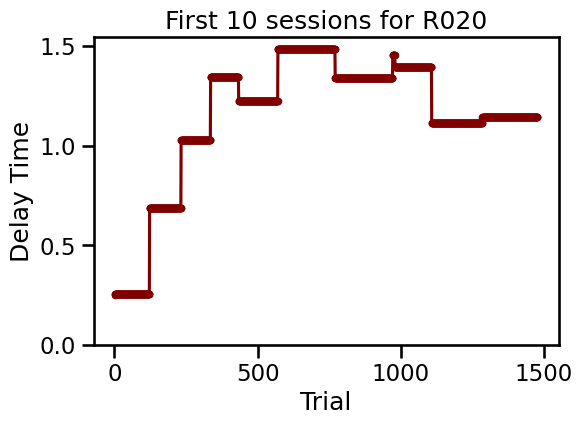

In [20]:
fig, ax = plt.subplots(figsize=(6, 4))

ax.plot(subdf.cumulative_trial, subdf.fixation_dur, marker=".", color="maroon")

ax.set(
    ylabel="Delay Time", xlabel="Trial", title=f"First 10 sessions for {single_animal}"
)

ax.set_ylim(0, None)

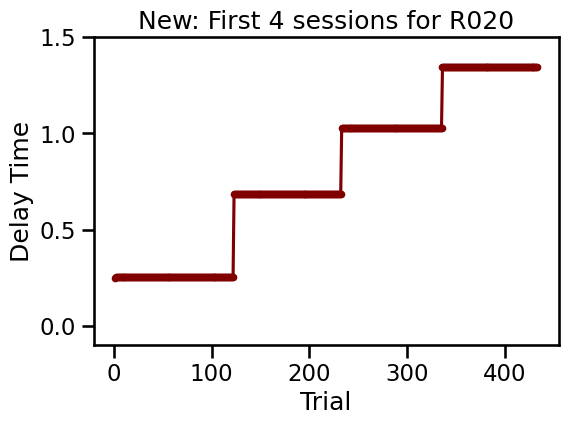

In [21]:
fig, ax = plt.subplots(figsize=(6, 4))

ax.plot(
    subdf.query("session < 5").cumulative_trial,
    subdf.query("session < 5").fixation_dur,
    marker=".",
    color="maroon",
)

_ = ax.set(
    ylabel="Delay Time",
    xlabel="Trial",
    title=f"New: First 4 sessions for {single_animal}",
    ylim=(-0.1, 1.5),
)

[Text(0, 0.5, 'Delay Time'),
 Text(0.5, 0, 'Trial'),
 Text(0.5, 1.0, 'Sesion 10 for R020')]

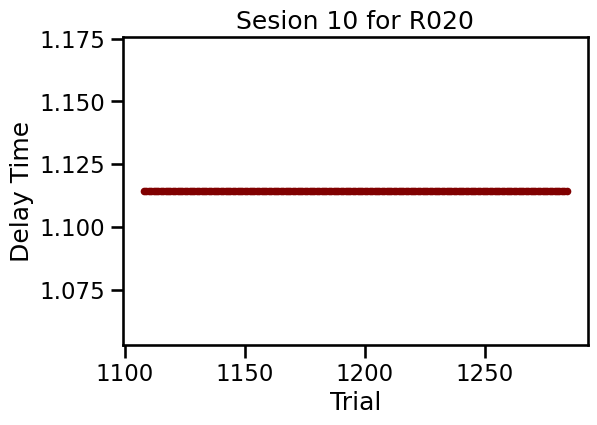

In [22]:
fig, ax = plt.subplots(figsize=(6, 4))

ax.plot(
    subdf.query("session == 9").cumulative_trial,
    subdf.query("session == 9").fixation_dur,
    marker=".",
    color="maroon",
)

ax.set(ylabel="Delay Time", xlabel="Trial", title=f"Sesion 10 for {single_animal}")

### 2.1.1 Fixation Delay Over Trials

Looking at only the first 50 sessions. Sometimes animals get set back into these earlier stages because of a rig switch or difficuluties with the sounds

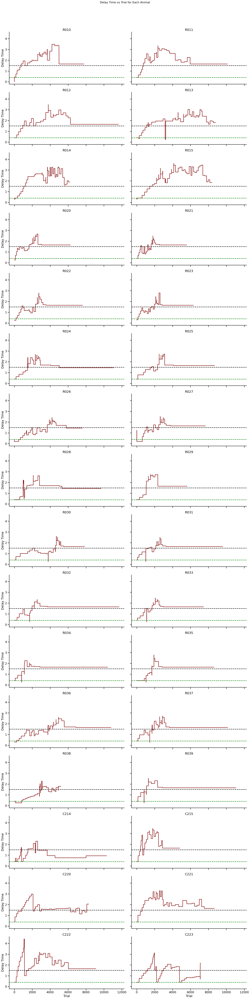

In [29]:
def matplolib_plot(x, y, **kwargs):
    plt.plot(x, y, **kwargs)


# Create a FacetGrid with 2 columns
g = sns.FacetGrid(
    tdf.query("session < 50"), col="animal_id", col_wrap=2, height=5, aspect=2
)

# Map the lineplot function to each subset of the data
g.map(matplolib_plot, "cumulative_trial", "fixation_dur", color="maroon")
g.map(plt.axhline, y=1.5, color="k", linestyle="--")
g.map(plt.axhline, y=0.4, color="g", linestyle="--")


# Add titles and adjust layout if needed
g.set_titles(col_template="{col_name}")
g.fig.subplots_adjust(top=0.95)
g.fig.suptitle("Delay Time vs Trial for Each Animal", fontsize=16)
g.set_axis_labels("Trial", "Delay Time")

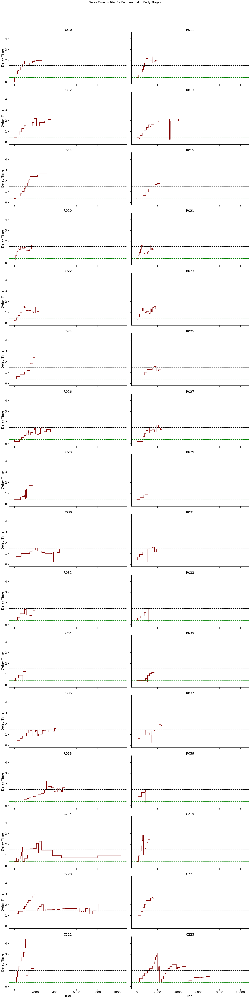

In [30]:
# Create a FacetGrid with 2 columns
g = sns.FacetGrid(
    tdf.query("stage < 9 and session < 50"),
    col="animal_id",
    col_wrap=2,
    height=5,
    aspect=2,
)

# Map the lineplot function to each subset of the data
g.map(matplolib_plot, "cumulative_trial", "fixation_dur", color="maroon")
g.map(plt.axhline, y=1.5, color="k", linestyle="--")
g.map(plt.axhline, y=0.4, color="g", linestyle="--")


# Add titles and adjust layout if needed
g.set_titles(col_template="{col_name}")
g.fig.subplots_adjust(top=0.95)
g.fig.suptitle("Delay Time vs Trial for Each Animal in Early Stages", fontsize=16)
g.set_axis_labels("Trial", "Delay Time")

In looking at my trianing section code- a threshold of 1.3 or 1.4 would make the most since since once the animal itself pokes for 1.6 (actual time in cpoke, not the required time), then it becomes a random sampling of delay times which may or may not be greater than 1.5.

There are also some animals I want to have a double look at.

* R023 growth point reached before doing into random
* animals that appeared to be dropped below 400:
    * R013, R014, R015 (very few trials!)
    * R020
    * R023
    * R022
    * R026
    * R027
    * R036
    * R038

## 2.2. Animals that started below 400 ms

These are animals that had to have their initial fixation value dropped for some reason or another. Generally, because they weren't able to fixate for the high start value of 400 ms.

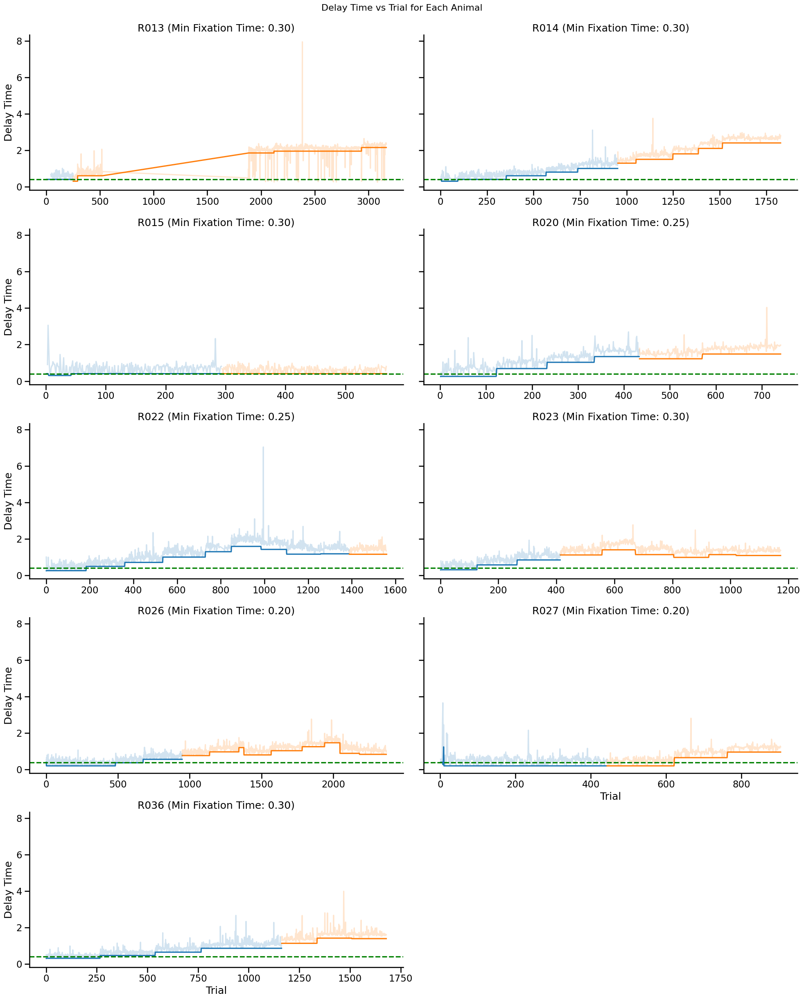

In [46]:
min_start = [  # switch to minimum_drop
    "R013",
    "R014",
    "R015",
    "R020",
    "R022",
    "R023",
    "R026",
    "R027",
    "R036",
]
stage_max = 7
session_max = 50


plot_df = tdf.query(
    "animal_id in @min_start and session < @session_max and stage < @stage_max"
)

# Calculate the minimum fixation time for each animal_id
min_fixation_times = plot_df.groupby("animal_id")["fixation_dur"].min()

# Create a FacetGrid with 2 columns
g = sns.FacetGrid(
    plot_df, col="animal_id", col_wrap=2, height=5, aspect=2, hue="stage", sharex=False
)


g.map(sns.lineplot, "cumulative_trial", "fixation_dur")
g.map(sns.lineplot, "cumulative_trial", "cpoke_dur", alpha=0.2)

g.map(plt.axhline, y=0.4, color="g", linestyle="--")
# Add titles with minimum fixation time for each animal
for ax, animal_id in zip(g.axes.flat, min_fixation_times.index):
    min_fixation_time = min_fixation_times[animal_id]
    ax.set_title(f"{animal_id} (Min Fixation Time: {min_fixation_time:.2f})")


# Add titles and adjust layout if needed
g.fig.subplots_adjust(top=0.95)
g.fig.suptitle("Delay Time vs Trial for Each Animal", fontsize=16)
g.set_axis_labels("Trial", "Delay Time")

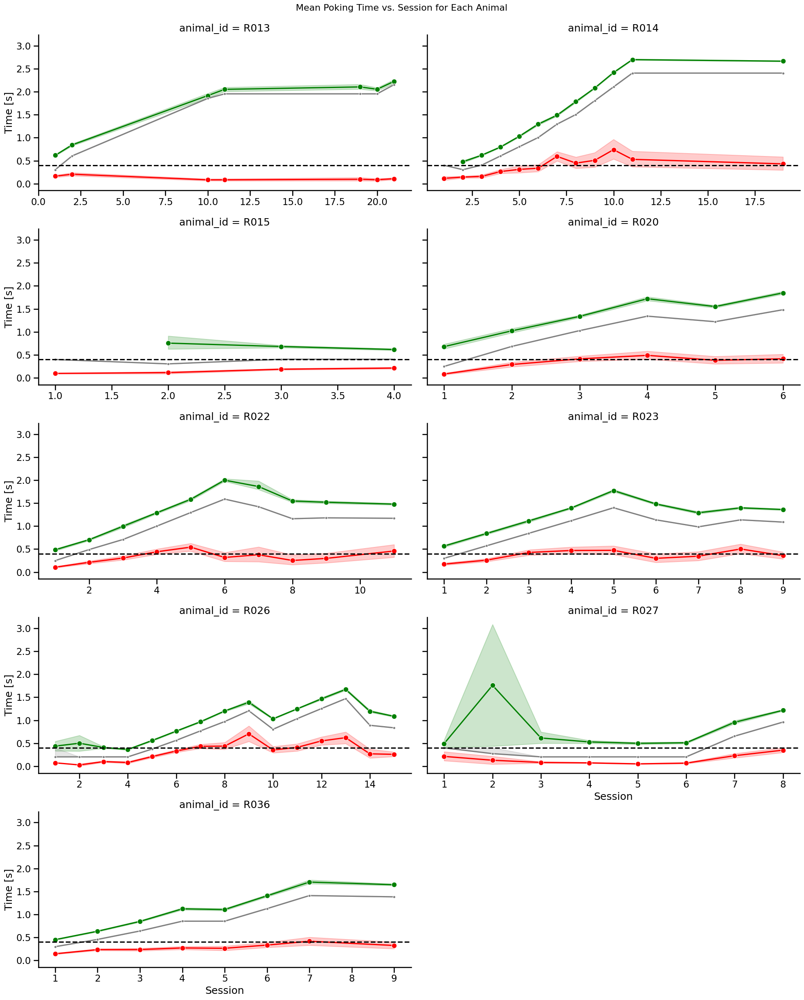

In [33]:
plot_df = tdf.query(
    "animal_id in @min_start and session < @session_max and stage < @stage_max"
)

# Calculate the minimum fixation time for each animal_id
min_fixation_times = plot_df.groupby("animal_id")["fixation_dur"].min()

# Create a FacetGrid with 2 columns
g = sns.FacetGrid(
    plot_df, col="animal_id", col_wrap=2, height=5, aspect=2, sharex=False
)


g.map(sns.lineplot, "session", "cpoke_dur", marker="o", color="green")
g.map(sns.lineplot, "session", "avg_settling_in", marker="o", color="red")
g.map(
    sns.lineplot, "session", "fixation_dur", marker=".", color="gray", estimator="min"
)

g.map(plt.axhline, y=0.4, color="k", linestyle="--")

# Add titles and adjust layout if needed
g.fig.subplots_adjust(top=0.95)
g.fig.suptitle("Mean Poking Time vs. Session for Each Animal", fontsize=16)
g.set_axis_labels("Session", "Time [s]")

These plots are interesting, lets make them for all the animals and see

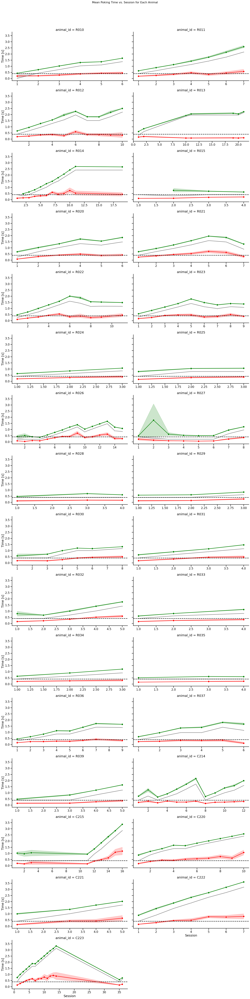

In [34]:
plot_df = tdf.query("session < @session_max and stage < @stage_max")

# Calculate the minimum fixation time for each animal_id
min_fixation_times = plot_df.groupby("animal_id")["fixation_dur"].min()

# Create a FacetGrid with 2 columns
g = sns.FacetGrid(
    plot_df, col="animal_id", col_wrap=2, height=5, aspect=2, sharex=False
)


g.map(sns.lineplot, "session", "cpoke_dur", marker="o", color="green")
g.map(sns.lineplot, "session", "avg_settling_in", marker="o", color="red")
g.map(
    sns.lineplot, "session", "fixation_dur", marker=".", color="gray", estimator="min"
)

g.map(plt.axhline, y=0.4, color="k", linestyle="--")

# Add titles and adjust layout if needed
g.fig.subplots_adjust(top=0.95)
g.fig.suptitle("Mean Poking Time vs. Session for Each Animal", fontsize=16)
g.set_axis_labels("Session", "Time [s]")

[Text(0.5, 0, 'Session'),
 Text(0, 0.5, 'Time [s]'),
 Text(0.5, 1.0, 'GNP Center Poke Timing Across Animals'),
 (0.0, 1.941893699678801)]

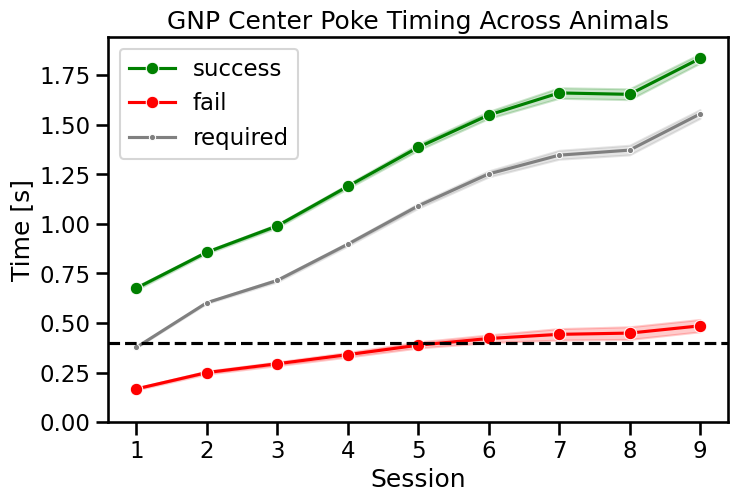

In [35]:
plot_df = tdf.query("session < 10 and stage < 8")

# Melt the DataFrame
melted_df = plot_df.melt(
    id_vars=["animal_id", "session"],
    value_vars=["cpoke_dur", "avg_settling_in", "fixation_dur"],
    var_name="condition",
    value_name="time",
)

# Rename the conditions
condition_mapping = {
    "cpoke_dur": "success",
    "avg_settling_in": "fail",
    "fixation_dur": "required",
}
melted_df["condition"] = melted_df["condition"].map(condition_mapping)

# Define the colors for each condition
palette = {"success": "green", "fail": "red", "required": "gray"}

# Create the plot
fig, ax = plt.subplots(figsize=(8, 5))
sns.lineplot(
    data=melted_df,
    x="session",
    y="time",
    hue="condition",
    style="condition",
    markers=["o", "o", "."],
    dashes=False,
    palette=palette,
    ax=ax,
)

ax.axhline(y=0.4, color="k", linestyle="--")
ax.legend()
ax.set(
    xlabel="Session",
    ylabel="Time [s]",
    title="GNP Center Poke Timing Across Animals",
    ylim=(0, None),
)

As you can see, some animals have session 1 with a lower requirement. In gneral, succesful poking grows about 200 ms faster than the required poking (either due to motor timing or length of the go cue). The avg failed poke grows slower. Lets now split by animals that got the 400 ms start and animals that didn't.

[Text(0.5, 0, 'Session'),
 Text(0, 0.5, 'Time [s]'),
 Text(0.5, 1.0, 'Animals NOT Succesful with 400 ms start'),
 (0.0, 2.0763160705823305)]

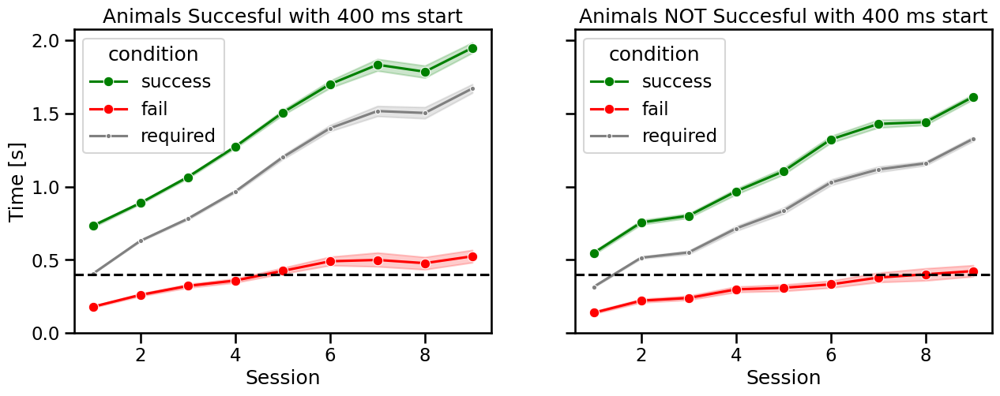

In [36]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5), sharey=True)

sns.lineplot(
    data=melted_df.query("animal_id not in @min_start"),
    x="session",
    y="time",
    hue="condition",
    style="condition",
    markers=["o", "o", "."],
    dashes=False,
    palette=palette,
    ax=ax[0],
)

ax[0].axhline(y=0.4, color="k", linestyle="--")
# ax.legend()
ax[0].set(
    xlabel="Session",
    ylabel="Time [s]",
    title="Animals Succesful with 400 ms start",
    ylim=(0, None),
)

sns.lineplot(
    data=melted_df.query("animal_id in @min_start"),
    x="session",
    y="time",
    hue="condition",
    style="condition",
    markers=["o", "o", "."],
    dashes=False,
    palette=palette,
    ax=ax[1],
)

ax[1].axhline(y=0.4, color="k", linestyle="--")
# ax.legend()
ax[1].set(
    xlabel="Session",
    ylabel="Time [s]",
    title="Animals NOT Succesful with 400 ms start",
    ylim=(0, None),
)

Animals that didn't get the 400 start (right) have slower growth compared to the animals that do. I seems to eventually grow at the same rate, but just starts slower. Let's look more at their failed rate.`

In [37]:
first_cpoke_sessions = tdf.query(
    "fixation_dur > .39 and fixation_dur < .41 and stage < 8"
).copy()

first_cpoke_sessions["failed_time"] = (
    first_cpoke_sessions["avg_settling_in"] - first_cpoke_sessions["fixation_dur"]
)
# if animal is in min_start, then then label start column and "lower" else label as "normal"
first_cpoke_sessions["start"] = np.where(
    first_cpoke_sessions["animal_id"].isin(min_start), "lower", "normal"
)

Text(0.5, 1.0, 'Failed Time for 400 ms fixation')

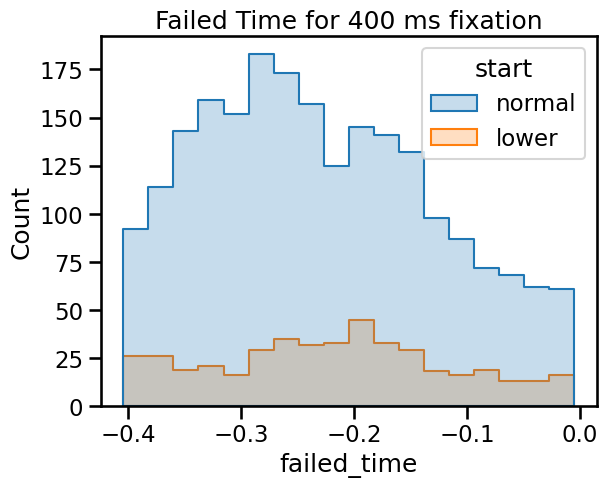

In [38]:
cleaned_data = first_cpoke_sessions.dropna(subset=["failed_time", "start"])
sns.histplot(data=cleaned_data, x="failed_time", hue="start", element="step")
plt.title("Failed Time for 400 ms fixation")

The next thing I want to do is determine for the animals that had a low start and were in the auto-mated curriculum (e.g. not R01s where I manually watched their sessions and dropped the fication requirements), what defines a "bad" session such that the fix requirement drops.

I will start by plotting the delay time if it's below 0.5 and session 20 for all animals just to get an idea of the early stages and days that pass.

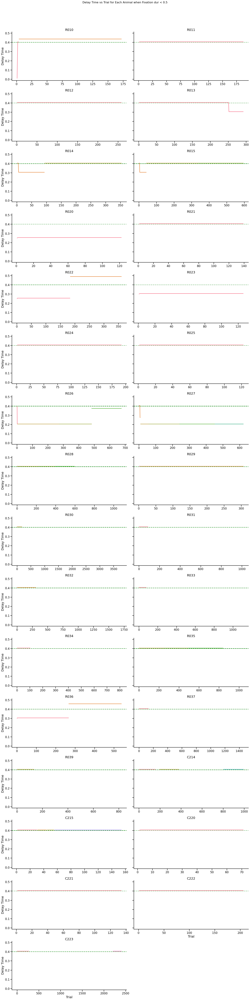

In [47]:
plot_df = tdf.query("session < 20 and fixation_dur < 0.5").copy()

# Create a FacetGrid with 2 columns
g = sns.FacetGrid(
    plot_df,
    col="animal_id",
    col_wrap=2,
    height=5,
    aspect=2,
    sharex=False,
    hue="session",
    palette="husl",
)

# Map the lineplot function to each subset of the data
g.map(
    sns.lineplot,
    "cumulative_trial",
    "fixation_dur",
)
g.map(plt.axhline, y=0.4, color="g", linestyle="--", alpha=0.5)


# Add titles and adjust layout if needed
g.set_titles(col_template="{col_name}")
g.fig.subplots_adjust(top=0.95)
g.fig.suptitle(
    "Delay Time vs Trial for Each Animal when Fixation dur < 0.5", fontsize=16
)
g.set_axis_labels("Trial", "Delay Time")

The animals that interest me here are : R020, R022, R023, R026, R027 and R036. Lets now plot a histogram of n done trials for these data where low_start indicates whether the session had a fixation value that was dropped. 

One bug in this approach is that these data do not include sessions where n_done_trials < 0, so I may need to go to the sessions table.

In [48]:
plot_df["low_start"] = plot_df["fixation_dur"] < 0.40

grouped_df = (
    plot_df.groupby(["animal_id", "session", "low_start"]).trial.max().reset_index()
)
grouped_df.head()

,animal_id,session,low_start,trial
0,C214,1,False,156
1,C214,3,False,184
2,C214,8,False,188
3,C215,1,False,30
4,C215,2,False,14


<Axes: xlabel='trial', ylabel='Count'>

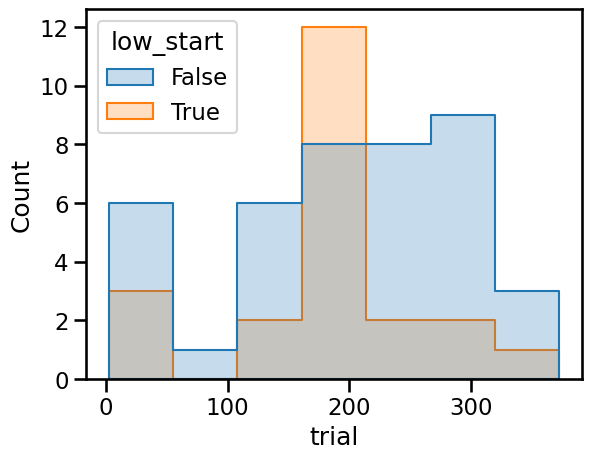

In [49]:
r1s = ["R010", "R011", "R012", "R013", "R014", "R015"]
sns.histplot(
    grouped_df.query("animal_id not in @r1s"),
    x="trial",
    hue="low_start",
    element="step",
)

(0.0, 40.0)

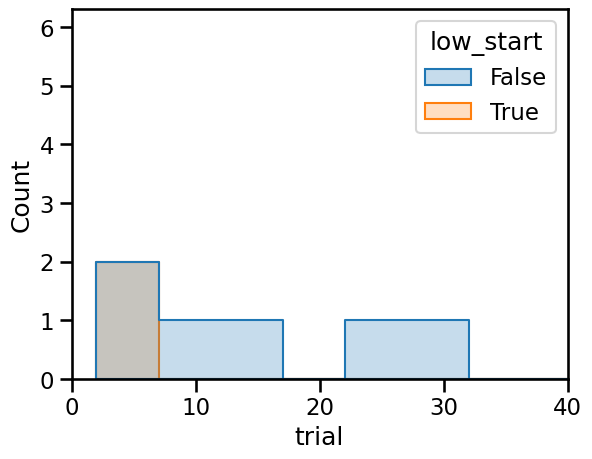

In [50]:
sns.histplot(
    grouped_df.query("animal_id not in @r1s"),
    x="trial",
    hue="low_start",
    element="step",
    binwidth=5,
)
plt.xlim(0, 40)

Alright- it looks like something in the 5-15 range could work. For the animals I mentioned above, I am going to look at their sessions data and see what values there are for trial in stage 5

`R020`: looks like this animal had a pd.lens issue and their first day in the rig their n_done_trials was 0 so it got dropped. There was a stage switch from 4 to 5 here- I don't think that should happen within session

`R022`: same thing occurred as with R022, a transition within a session from spoke to cpoke and didn't get it to dropped for the next day

`R023`: did a single trial on day 1 with 0.99 violation rate- kinda confusing? and then dropped

`R026`: Did 280 trials, then 2 then 270 trials. No idea why i did this, found some cryptic logseq notes about "increasing motivation" but this seems misguided given the data

`R027`: DId two days of 4 trials lowered it, then 51 then got it

`R036`: this animal went through some weirs stuff- had a day of 8 trials and then moved on.

> Conclusion from digging: I think a "bad day" is anything less than 15 trials for this early stage. For the later stages when animals "get" it and we are deciding if growth should happen overnight or not then perhaps > 50 trials is a good threshold. 

If greater than 50 trials, take today's mean cpoke dur and set it. This is only technically valid cpokes. If today was bad (less than 50 trials and > 3 pokes per trial, then decrease by half the differences of avg settling in and requirement). 



## 2.3 Average Settling In Time

Here, I want to see what the average settling in time is for animals, especially in stage 5 when they are just starting to poke. This well help me determine what an appropriate settling in time would be for the experiment where I have some animals starting high/late penalty and other starting low/early penalty. 

How low is low? What is the allowed free fixation time before a violation can happen?

### 2.3.1 Avg Settling In When Fixation is Small < 0.45

[Text(0.5, 0, 'Failed Cpoke Dur [s]'),
 Text(0.5, 1.0, 'Stage 5: Median dur failed: 0.15'),
 (-0.025, 0.45)]

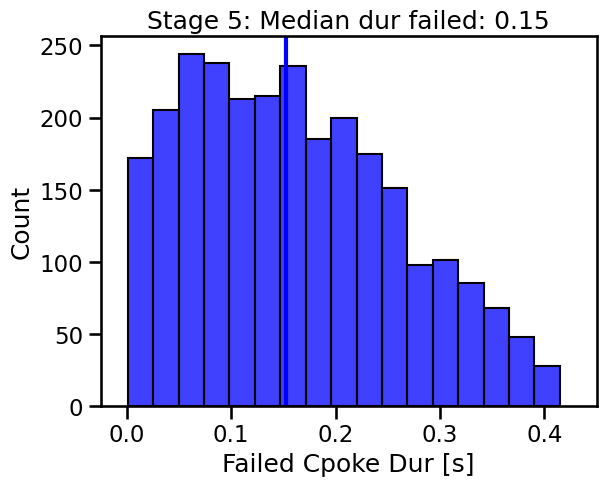

In [72]:
plot_df = tdf.query("stage == 5 and fixation_dur < 0.45").copy()
fig, ax = plt.subplots()
sns.histplot(
    plot_df.avg_settling_in,
    color="blue",
    binwidth=0.025,
    ax=ax,
)
ax.axvline(
    plot_df.avg_settling_in.median(),
    color="blue",
    lw=3,
)
ax.set(
    xlabel="Failed Cpoke Dur [s]",
    title=f"Stage 5: Median dur failed: {plot_df.avg_settling_in.median():.2f}",
    xlim=(-0.025, 0.45),
)

> It appears that in low fixation fixation cases (fixation dur < 0.45), the avg failed duration has a median of 0.15. This suggests that 150 ms is a good cut off point for "free" poking. Ie if you poke less than this, I won't count the trial and you can restart. If you poke more than this, I will assume you intended to start the trial and violations are valid.


### 2.3.2 Average Settling in When Violations are On (Not Including Sound Stages)

[Text(0.5, 0, 'Failed Cpoke Dur [s]'),
 Text(0.5, 1.0, 'Stage 8: Median dur failed: 0.10'),
 (-0.025, 0.45)]

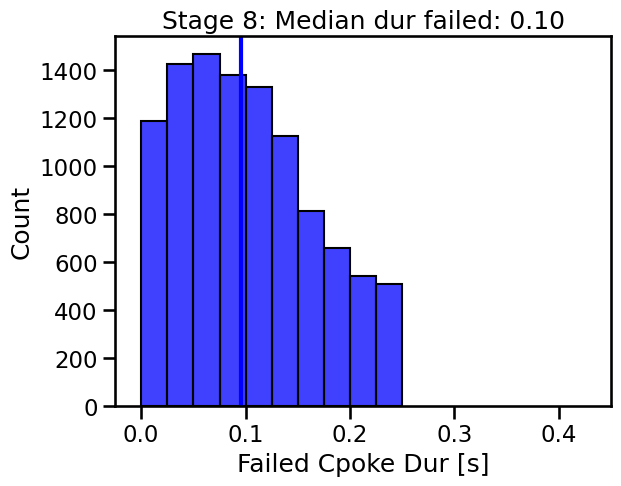

In [73]:
valid_stages = [8]
plot_df = tdf.query("stage in @valid_stages").copy()
fig, ax = plt.subplots()
sns.histplot(
    plot_df.avg_settling_in,
    color="blue",
    binwidth=0.025,
    ax=ax,
)
ax.axvline(
    plot_df.avg_settling_in.median(),
    color="blue",
    lw=3,
)
ax.set(
    xlabel="Failed Cpoke Dur [s]",
    title=f"Stage 8: Median dur failed: {plot_df.avg_settling_in.median():.2f}",
    xlim=(-0.025, 0.45),
)

[Text(0.5, 0, 'Failed Cpoke Dur [s]'),
 Text(0.5, 1.0, 'Stage 8,10,11: Median dur failed: 0.09'),
 (-0.025, 0.45)]

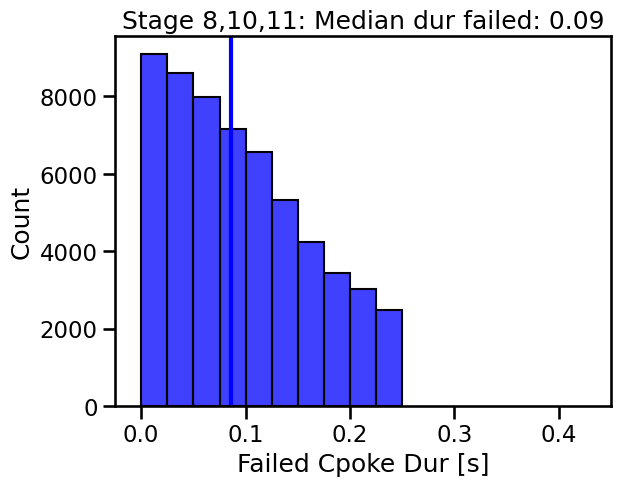

In [74]:
valid_stages = [8, 10, 11]
plot_df = tdf.query("stage in @valid_stages").copy()
fig, ax = plt.subplots()
sns.histplot(
    plot_df.avg_settling_in,
    color="blue",
    binwidth=0.025,
    ax=ax,
)
ax.axvline(
    plot_df.avg_settling_in.median(),
    color="blue",
    lw=3,
)
ax.set(
    xlabel="Failed Cpoke Dur [s]",
    title=f"Stage 8,10,11: Median dur failed: {plot_df.avg_settling_in.median():.2f}",
    xlim=(-0.025, 0.45),
)

### 2.3.3 Simulate growth given settling in 

Specifically for within session growth and low start

[Text(0, 0.5, 'Fixation Dur'),
 Text(0.5, 0, 'Trial'),
 Text(0.5, 1.0, 'Fixation Dur Growth')]

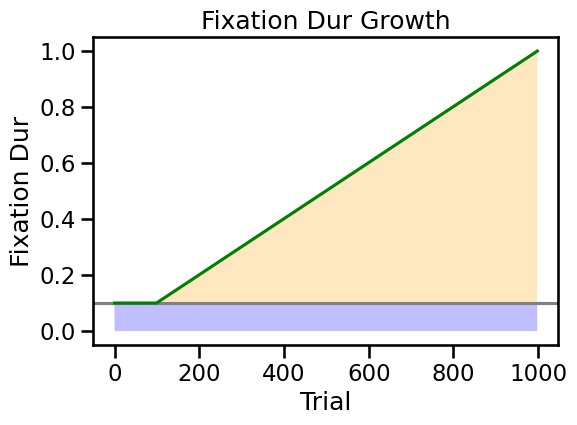

In [97]:
delay_growth = np.arange(0.001, 1, 0.001)
settling_in = 0.1

delay_growth[delay_growth < settling_in] = settling_in


fig, ax = plt.subplots(figsize=(6, 4))
ax.axhline(settling_in, color="gray")
ax.plot(delay_growth, color="green")

# Define the condition for filling
condition = delay_growth <= settling_in

# Fill below the gray line and below the delay_growth curve
# Fill below the gray line
ax.fill_between(
    np.arange(len(delay_growth)),
    np.minimum(delay_growth, settling_in),
    0,
    facecolor="blue",
    alpha=0.25,
)
# Fill above the gray line
ax.fill_between(
    np.arange(len(delay_growth)),
    delay_growth,
    settling_in,
    where=(delay_growth >= settling_in),
    facecolor="orange",
    alpha=0.25,
)

ax.set(
    ylabel="Fixation Dur",
    xlabel="Trial",
    title="Fixation Dur Growth",
)

[Text(0, 0.5, 'Fixation Dur'),
 Text(0.5, 0, 'Trial'),
 Text(0.5, 1.0, 'Fixation Dur Growth')]

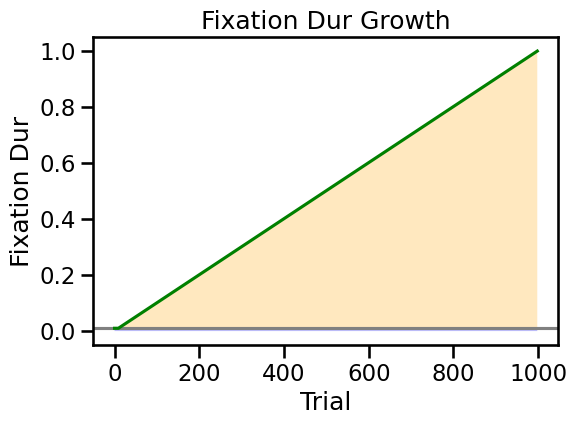

In [99]:
delay_growth = np.arange(0.001, 1, 0.001)
settling_in = 0.010

delay_growth[delay_growth < settling_in] = settling_in


fig, ax = plt.subplots(figsize=(6, 4))
ax.axhline(settling_in, color="gray")
ax.plot(delay_growth, color="green")

# Define the condition for filling
condition = delay_growth <= settling_in

# Fill below the gray line and below the delay_growth curve
# Fill below the gray line
ax.fill_between(
    np.arange(len(delay_growth)),
    np.minimum(delay_growth, settling_in),
    0,
    facecolor="blue",
    alpha=0.25,
)
# Fill above the gray line
ax.fill_between(
    np.arange(len(delay_growth)),
    delay_growth,
    settling_in,
    where=(delay_growth >= settling_in),
    facecolor="orange",
    alpha=0.25,
)

ax.set(
    ylabel="Fixation Dur",
    xlabel="Trial",
    title="Fixation Dur Growth",
)

> Interesting! when the pokes start to really count animals tighten up their poking time. These data suggest that when violations are on, and settling ins are allowed to be as high as 0.25 before a trial starts, animals will still poke less than that for median of 100 ms when violations first turn on and 90 ms after. 

**Conclusion** A settling in of 100 - 150 ms seems to be a reasonable range to use for the shared probe stages/when violation penalty turns on for the late violation animals.

## 2.4 Growing to Threshold of 1.4 Seconds

Dropping C214 since this animal is a clear outlier and making it difficult to interpret the plot. Also, I only want to look priot to stage 8.

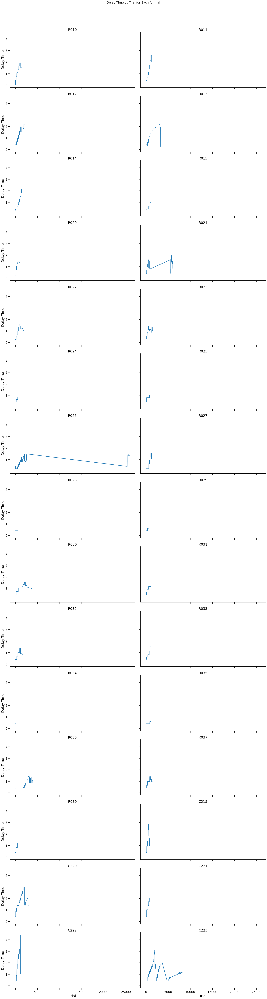

In [26]:
# Create a FacetGrid with 2 columns
g = sns.FacetGrid(
    tdf.query("animal_id != 'C214' and stage <8"),
    col="animal_id",
    col_wrap=2,
    height=5,
    aspect=2,
)

# Map the lineplot function to each subset of the data
g.map(matplolib_plot, "cumulative_trial", "fixation_dur")

# Add titles and adjust layout if needed
g.set_titles(col_template="{col_name}")
g.fig.subplots_adjust(top=0.95)
g.fig.suptitle("Delay Time vs Trial for Each Animal", fontsize=16)
g.set_axis_labels("Trial", "Delay Time")

In [27]:
def filter_sessions_up_to_threshold(df, threshold, col="delay_time"):
    """
    Filters the DataFrame to include all sessions for each animal leading up to (and including) the first session
    where the maximum delay_time is above the given threshold.

    Parameters:
    df (pd.DataFrame): DataFrame containing columns 'animal_id', 'session_id', 'trial', and 'delay_time'.
    threshold (float): The threshold above which we stop including sessions.

    Returns:
    pd.DataFrame: A filtered DataFrame containing sessions leading up to (and including) the first session
                  where the maximum delay_time is above the threshold for each animal.
    """
    # Step 1: Group by animal_id and session_id, and calculate the maximum delay_time for each session
    max_delay_time_per_session = (
        df.groupby(["animal_id", "session"])[col].max().reset_index()
    )

    dfs = []

    # Step 2: Iterate over each animal_id
    for animal_id, group in max_delay_time_per_session.groupby("animal_id"):
        # Step 3: Find the first session where the maximum delay_time is above the threshold
        above_threshold_session = group[group[col] > threshold]
        if not above_threshold_session.empty:
            first_above_threshold_session = above_threshold_session.iloc[0]["session"]

            print(
                f"animal_id = {animal_id}, above threshold session = {first_above_threshold_session}"
            )

            # Step 4: Grab all sessions to threshold and append
            dfs.append(
                df.query(
                    "animal_id == @animal_id and session <= @first_above_threshold_session"
                )
            )

    # Step 5: Filter the original DataFrame to include only the rows from the sessions to keep
    filtered_df = pd.concat(dfs, ignore_index=True)

    return filtered_df

In [28]:
threshold = 1.4
short_del_df = filter_sessions_up_to_threshold(
    tdf, threshold=threshold, col="fixation_dur"
)

animal_id = C214, above threshold session = 7
animal_id = C215, above threshold session = 14
animal_id = C220, above threshold session = 6
animal_id = C221, above threshold session = 5
animal_id = C222, above threshold session = 3
animal_id = C223, above threshold session = 5
animal_id = R010, above threshold session = 8
animal_id = R011, above threshold session = 5
animal_id = R012, above threshold session = 5
animal_id = R013, above threshold session = 6
animal_id = R014, above threshold session = 8
animal_id = R015, above threshold session = 8
animal_id = R020, above threshold session = 6
animal_id = R021, above threshold session = 5
animal_id = R022, above threshold session = 6
animal_id = R023, above threshold session = 13
animal_id = R024, above threshold session = 6
animal_id = R025, above threshold session = 8
animal_id = R026, above threshold session = 13
animal_id = R027, above threshold session = 10
animal_id = R028, above threshold session = 6
animal_id = R029, above thresh

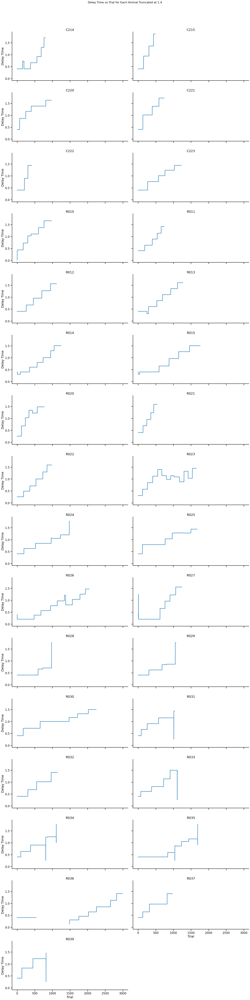

In [29]:
# Create a FacetGrid with 2 columns
g = sns.FacetGrid(
    short_del_df,
    col="animal_id",
    col_wrap=2,
    height=5,
    aspect=2,
)

# Map the lineplot function to each subset of the data
g.map(
    matplolib_plot,
    "cumulative_trial",
    "fixation_dur",
)

# Add titles and adjust layout if needed
g.set_titles(col_template="{col_name}")
g.fig.subplots_adjust(top=0.95)
g.fig.suptitle(
    f"Delay Time vs Trial for Each Animal Truncated at {threshold}", fontsize=16
)
g.set_axis_labels("Trial", "Delay Time")

/var/folders/__/8jn6qz211155h1xb451s5zcr0000gn/T/ipykernel_87064/3111128910.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks())


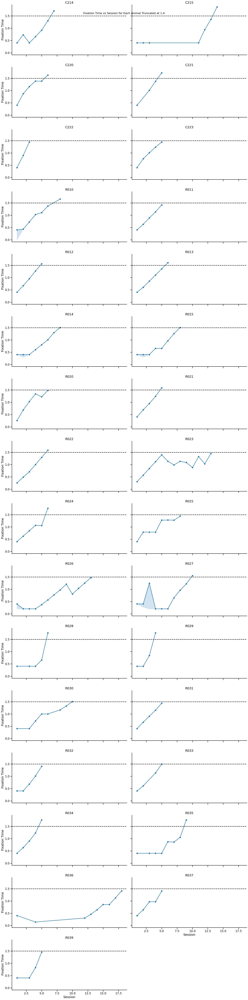

In [30]:
# Create a FacetGrid with 2 columns
g = sns.FacetGrid(
    short_del_df,
    col="animal_id",
    col_wrap=2,
    height=5,
    aspect=2,
)

# Map the lineplot function to each subset of the data
g.map(sns.lineplot, "session", "fixation_dur", marker="o", estimator="max")

# Add titles and adjust layout if needed
g.set_titles(col_template="{col_name}")
g.fig.subplots_adjust(top=0.95)
g.fig.suptitle(
    f"Fixation Time vs Session for Each Animal Truncated at {threshold}", fontsize=16
)
g.set_axis_labels("Session", "Fixation Time")

g.map(plt.axhline, y=1.5, color="k", linestyle="--")
for ax in g.axes.flatten():
    ax.set_xticklabels(ax.get_xticks())

/var/folders/__/8jn6qz211155h1xb451s5zcr0000gn/T/ipykernel_87064/3110608367.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks())


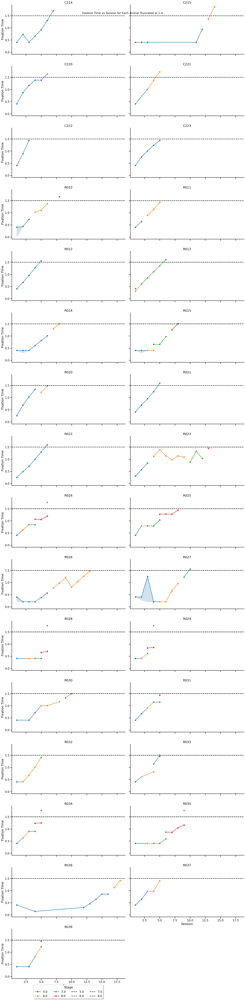

In [32]:
# Create a FacetGrid with 2 columns
g = sns.FacetGrid(
    short_del_df,
    hue="stage",
    col="animal_id",
    col_wrap=2,
    height=5,
    aspect=2,
)

# Map the lineplot function to each subset of the data
g.map(sns.lineplot, "session", "fixation_dur", marker="o", estimator="max")

# Add titles and adjust layout if needed
g.set_titles(col_template="{col_name}")
g.fig.subplots_adjust(top=0.95)
g.fig.suptitle(
    f"Fixation Time vs Session for Each Animal Truncated at {threshold}", fontsize=16
)
g.set_axis_labels("Session", "Fixation Time")

g.map(plt.axhline, y=1.5, color="k", linestyle="--")
for ax in g.axes.flatten():
    ax.set_xticklabels(ax.get_xticks())

# put on the legend to the g facet grid
plt.legend(
    title="Stage",
    loc="upper center",
    bbox_to_anchor=(0.5, -0.1),
    ncol=4,
    fancybox=True,
    shadow=True,
)

I can see that R036 and C215 went back to spoke only stages- I want to remove those first and then start counting. But, for the take of time, I will just drop them

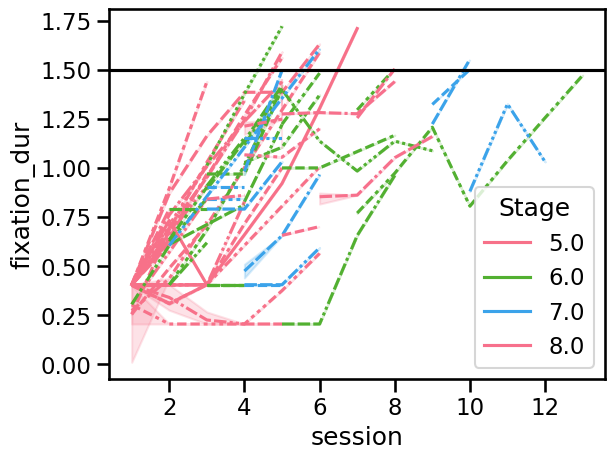

In [43]:
sns.lineplot(
    data=short_del_df.query("animal_id !='R036' and animal_id != 'C215' and stage < 9"),
    x="session",
    y="fixation_dur",
    hue="stage",
    style="animal_id",
    palette="husl",
)

# Get handles and labels
handles, labels = plt.gca().get_legend_handles_labels()

# Filter out style-related legend items (assuming they are not mixed with hue items in order)
# This approach assumes that the 'stage' related items are either at the beginning or end of the labels list.
# You might need to adjust the logic based on the actual order of items in your legend.
# One common approach is to remove handles and labels related to 'animal_id' directly if they are known.
filtered_handles = []
filtered_labels = []
for handle, label in zip(handles, labels):
    try:
        # Attempt to convert label to float (assuming 'stage' values can be converted)
        float(label)
        filtered_handles.append(handle)
        filtered_labels.append(label)
    except ValueError:
        # If conversion fails, the label is likely not a 'stage' value
        continue

plt.axhline(y=1.5, color="k")
# Recreate the legend with only 'stage' related items
plt.legend(filtered_handles, filtered_labels, title="Stage")

# )

Text(0.5, 1.0, 'R30s only')

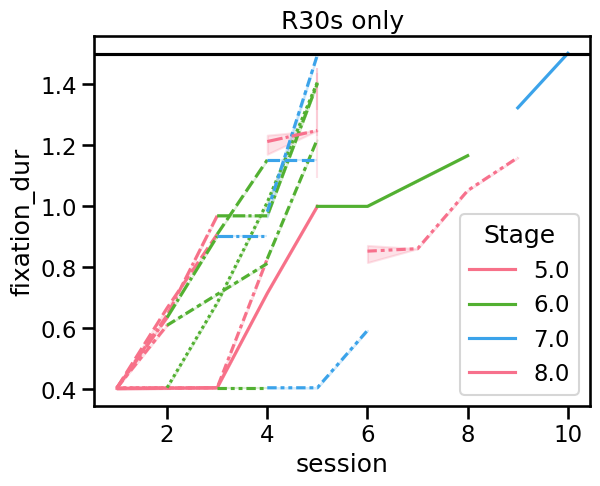

In [45]:
r3s = ["R030", "R031", "R032", "R033", "R034", "R035", "R037", "R038", "R039", "R040"]
sns.lineplot(
    data=short_del_df.query("animal_id in @r3s and stage < 9"),
    x="session",
    y="fixation_dur",
    hue="stage",
    style="animal_id",
    palette="husl",
)

# Get handles and labels
handles, labels = plt.gca().get_legend_handles_labels()

# Filter out style-related legend items (assuming they are not mixed with hue items in order)
# This approach assumes that the 'stage' related items are either at the beginning or end of the labels list.
# You might need to adjust the logic based on the actual order of items in your legend.
# One common approach is to remove handles and labels related to 'animal_id' directly if they are known.
filtered_handles = []
filtered_labels = []
for handle, label in zip(handles, labels):
    try:
        # Attempt to convert label to float (assuming 'stage' values can be converted)
        float(label)
        filtered_handles.append(handle)
        filtered_labels.append(label)
    except ValueError:
        # If conversion fails, the label is likely not a 'stage' value
        continue

plt.axhline(y=1.5, color="k")
# Recreate the legend with only 'stage' related items
plt.legend(filtered_handles, filtered_labels, title="Stage")

plt.title("R30s only")

Text(0.5, 1.0, 'Number of Sessions to 1.4s Fixation')

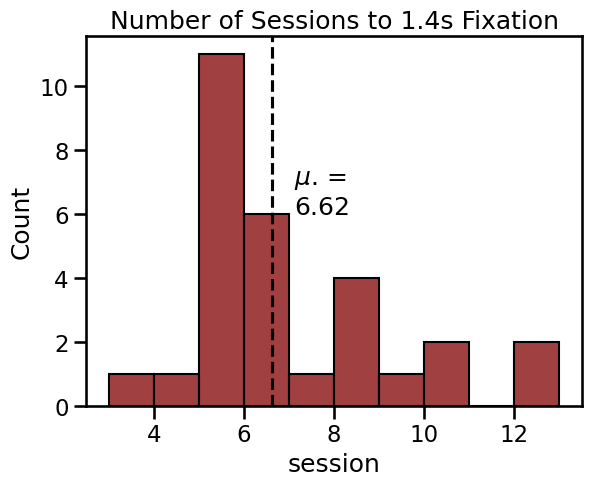

In [ ]:
animals_to_drop = ["C215", "R036"]
sess_to_gnp_thresh = (
    short_del_df.query("animal_id not in @animals_to_drop")
    .groupby("animal_id")
    .session.max()
    .reset_index()
)
sns.histplot(data=sess_to_gnp_thresh, x="session", binwidth=1, color="maroon")

mean = sess_to_gnp_thresh.session.mean()
plt.axvline(mean, color="k", linestyle="--")
plt.text(x=mean + 0.5, y=6, s=f"$\mu$. = \n{mean:.2f}")
plt.title("Number of Sessions to 1.4s Fixation")

/var/folders/__/8jn6qz211155h1xb451s5zcr0000gn/T/ipykernel_33493/597325496.py:2: UserWarning: 
The palette list has fewer values (28) than needed (29) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(


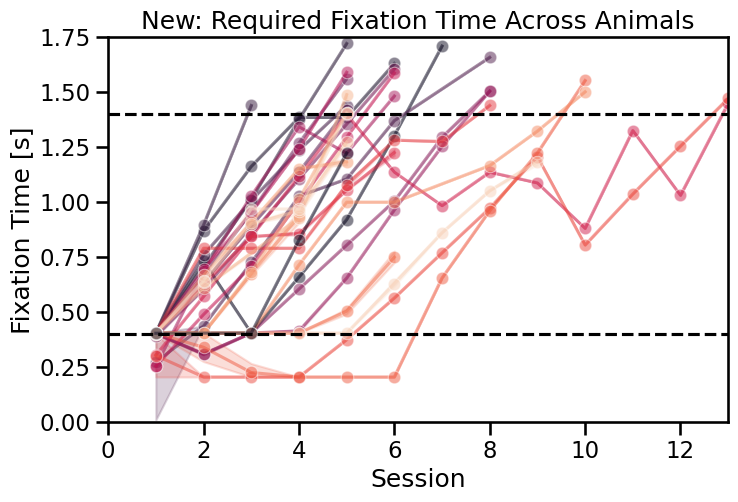

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))
sns.lineplot(
    data=short_del_df.query("animal_id not in @animals_to_drop"),
    x="session",
    y="fixation_dur",
    hue="animal_id",
    marker="o",
    palette=sns.color_palette("rocket", n_colors=plot_df.animal_id.nunique()),
    ax=ax,
    alpha=0.5,
)

ax.axhline(y=0.4, color="k", linestyle="--")
ax.axhline(y=1.4, color="k", linestyle="--")
ax.legend()
_ = ax.set(
    xlabel="Session",
    ylabel="Fixation Time [s]",
    title="New: Required Fixation Time Across Animals",
    ylim=(0, 1.75),
    xlim=(0, 13),
)
ax.get_legend().remove()

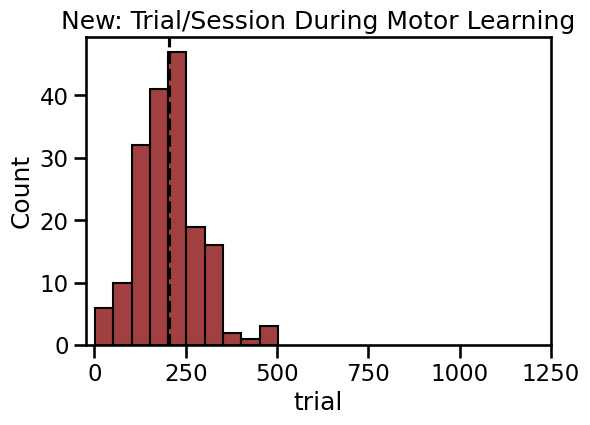

In [ ]:
drop_animals = ["C214", "C215", "R036"]
trial_rates_up_to_threshold = (
    short_del_df.query("animal_id not in @drop_animals and stage < 9")
    .groupby(["animal_id", "session"])
    .trial.max()
    .reset_index()
)

fig, ax = plt.subplots(figsize=(6, 4))
plot_df = trial_rates_up_to_threshold
sns.histplot(data=plot_df, x="trial", color="maroon", ax=ax, binwidth=50)

mean = plot_df.trial.mean()
ax.axvline(mean, color="k", linestyle="--")
_ = ax.set(
    title="New: Trial/Session During Motor Learning",
    xlim=(None, 1250),
)

In [47]:
max_del_time = (
    short_del_df.groupby(["animal_id", "session"]).fixation_dur.max().reset_index()
)

max_del_time["session_growth"] = max_del_time.groupby("animal_id").fixation_dur.diff()

(-1.2, 1.2)

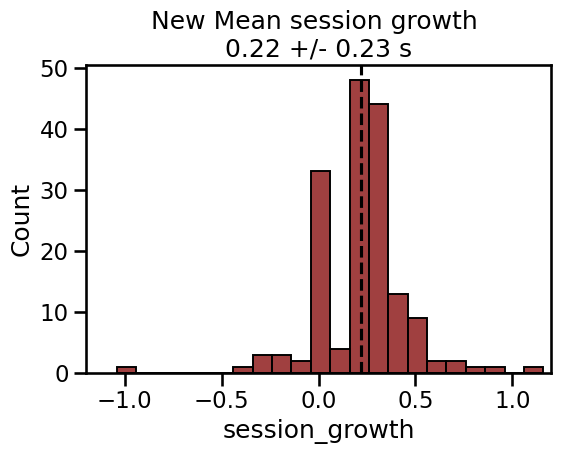

In [48]:
fig, ax = plt.subplots(figsize=(6, 4))

sns.histplot(data=max_del_time, x="session_growth", color="maroon", binwidth=0.1)
mean = max_del_time.session_growth.mean()
std = max_del_time.session_growth.std()
ax.axvline(mean, ls="--", color="k")
ax.set(title=f"New Mean session growth \n{mean.round(2)} +/- {std.round(2)} s")
plt.xlim(-1.2, 1.2)

In [89]:
import numpy as np


def simulate_delay_growth(
    threshold=1.5, R=10, initial_delay=0.300, mean=0.22, std=0.23
):
    """
    Simulate the delay growth process.

    Parameters:
    threshold (float): The threshold at which the delay growth stops.
    R (int): The number of runs.
    initial_delay (float): The initial delay time.
    mean (float): The mean of the Gaussian distribution.
    std (float): The standard deviation of the Gaussian distribution.

    Returns:
    list: A list containing the number of iterations for each run.
    """
    n_sessionsR = []
    delaysR = []

    for _ in range(R):
        run_delays = []
        delay = initial_delay
        n_sessions = 0

        while delay < threshold:
            growth = np.random.normal(mean, std)
            delay += growth
            n_sessions += 1
            run_delays.append(delay)

        n_sessionsR.append(n_sessions)
        delaysR.append(run_delays)

    return n_sessionsR, delaysR


def plot_single_simulation(R, threshold, sessions, delays):
    """
    Plot the simulated delay growth process.

    Parameters:
    R (int): The number of runs.
    threshold (float): The threshold at which the delay growth stops.
    sessions (list): A list containing the number of iterations for each run.
    delays (list): A list containing the delay values for each run.
    """
    fig, ax = plt.subplots(1, 2, figsize=(12, 4))
    for i in range(R):
        ax[0].plot(delays[i], label=f"Run {i+1}", color="salmon", alpha=0.75)

    ax[0].axhline(threshold, color="k", linestyle="--")
    ax[1].hist(
        sessions,
        bins=range(1, 15),
        color="salmon",
    )

    ax[1].axvline(np.mean(sessions), color="k", linestyle="--")

    fig.suptitle(
        f"Simulated Delay Growth N = {R}, threshold={threshold}",
    )


def bootstrap_simulation(
    delays, R=30, simulations=100, initial_delay=0.300, mean=0.22, std=0.23
):
    results = {}

    for threshold in delays:
        all_sessions = []

        for _ in range(simulations):
            n_sessionsR, _ = simulate_delay_growth(
                threshold=threshold,
                R=R,
                initial_delay=initial_delay,
                mean=mean,
                std=std,
            )
            all_sessions.extend(n_sessionsR)

        avg_sessions = np.mean(all_sessions)
        var_sessions = np.var(all_sessions)
        results[threshold] = (avg_sessions, var_sessions)

    return results

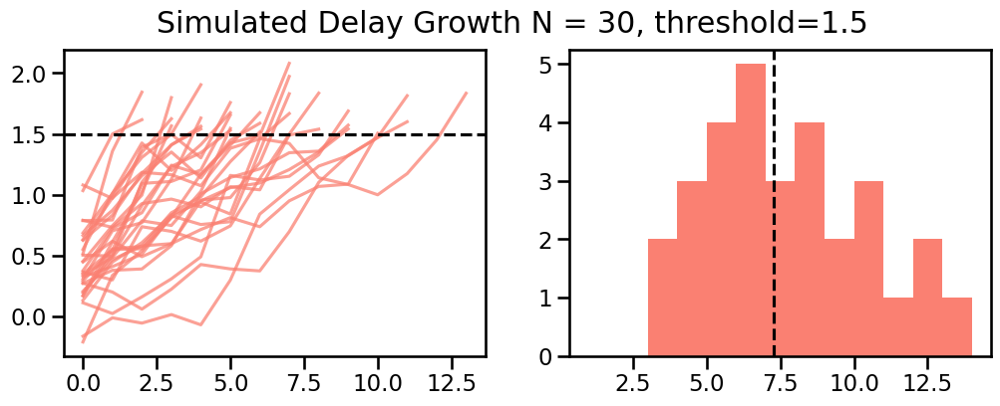

In [90]:
R = 30
threshold = 1.5

sessions, delays = simulate_delay_growth(threshold=threshold, R=R)
plot_single_simulation(R, threshold, sessions, delays)

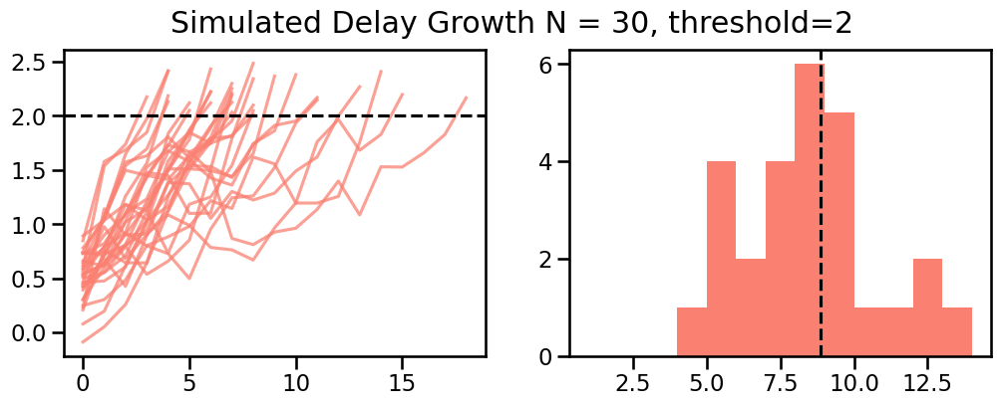

In [92]:
R = 30
threshold = 2

sessions, delays = simulate_delay_growth(threshold=threshold, R=R)
plot_single_simulation(R, threshold, sessions, delays)

In [95]:
# Parameters
R = 30
simulations = 1000
delays = [1.5, 1.6, 1.7, 1.8, 1.9, 2, 2.1, 2.2, 2.3, 2.4, 2.5]

# Run the bootstrap simulations
results = bootstrap_simulation(delays, R=R, simulations=simulations)

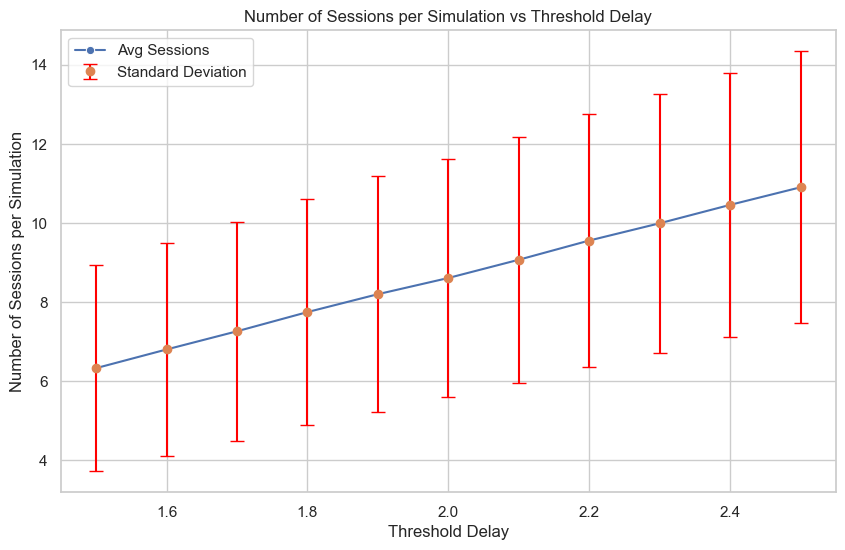

In [96]:
# Prepare data for plotting
x = []
y = []
y_err = []

for threshold in delays:
    avg_sessions, var_sessions = results[threshold]
    x.append(threshold)
    y.append(avg_sessions)
    y_err.append(np.sqrt(var_sessions))  # Standard deviation as error bar

# Plotting the results using Seaborn
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")

ax = sns.lineplot(x=x, y=y, marker="o", label="Avg Sessions")
plt.errorbar(
    x,
    y,
    yerr=y_err,
    fmt="o",
    capsize=5,
    capthick=1,
    ecolor="red",
    label="Standard Deviation",
)
ax.set(
    xlabel="Threshold Delay",
    ylabel="Number of Sessions per Simulation",
    title="Number of Sessions per Simulation vs Threshold Delay",
)

plt.legend()
plt.show()

Next steps:
* session by delay time
* clean up R010-R012
* clean up R023
* double check R028?

## Multi Cpoke Rates

In earlier stages when the violation penalty is off, this is the metric used to see how many tries animals do per trial to get the correct fixation timing.

Text(0.5, 0.98, 'New: Avg Cpokes/Trial for First 4 Sessions')

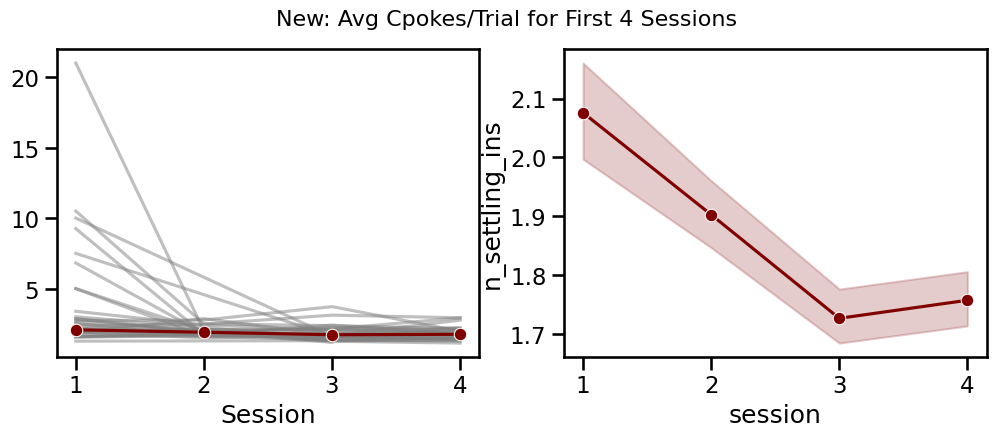

In [62]:
multi_cpoke_df = tdf.query(
    "stage < 8 and session < 50 and animal_id != 'R036'"
).copy()  # R036 had a day with > 1000 pokes, dropping due to error
multi_cpoke_df["multi_cpoke"] = multi_cpoke_df["n_settling_ins"] > 1
fig, ax = plt.subplots(1, 2, figsize=(12, 4))

sns.lineplot(
    data=multi_cpoke_df.query("session < 5 "),
    x="session",
    y="n_settling_ins",
    hue="animal_id",
    palette=(["gray"] * multi_cpoke_df.animal_id.nunique()),
    ax=ax[0],
    alpha=0.5,
    errorbar=None,
    legend=False,
)
for iax in ax:
    sns.lineplot(
        data=multi_cpoke_df.query("session < 5 "),
        x="session",
        y="n_settling_ins",
        ax=iax,
        marker="o",
        color="maroon",
    )
_ = ax[0].set(
    xlabel="Session",
    ylabel="Cpokes/Trial",
)

_ = ax[0].set(
    xlabel="Session",
    ylabel="",
)

fig.suptitle("New: Avg Cpokes/Trial for First 4 Sessions", fontsize=16)

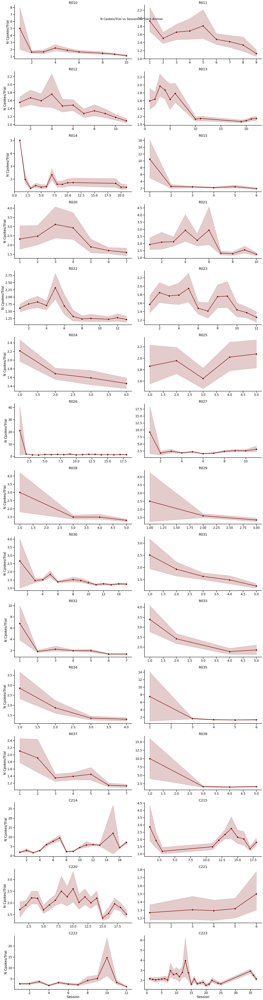

In [63]:
g = sns.FacetGrid(
    multi_cpoke_df,
    col="animal_id",
    col_wrap=2,
    height=5,
    aspect=2,
    sharex=False,
    sharey=False,
)

# Map the lineplot function to each subset of the data
g.map(
    sns.lineplot,
    "session",
    "n_settling_ins",
    marker="o",
    estimator="mean",
    color="maroon",
)
# Add titles and adjust layout if needed
g.set_titles(col_template="{col_name}")
g.fig.suptitle(
    f"N Cpokes/Trial vs Session for Each Animal",
    fontsize=16,
)
g.set_axis_labels("Session", "N Cpokes/Trial")

In [64]:
multi_cpoke_df

,trial,animal_id,date,sess_id,hits,violations,stage,sa,sb,stimuli_on,...,give_type_imp,give_frac,n_settling_ins,avg_settling_in,cpoke_dur,date_time_date,session,cumulative_trial,fixation_dur,multi_cpoke
5563,97,R010,2023-09-11,928485,1.0,0.0,5.0,12.0,12.0,False,...,light,1.0,NaN,NaN,NaN,2023-09-11,1,1,0.010000,False
5564,98,R010,2023-09-11,928485,1.0,0.0,5.0,12.0,12.0,False,...,water_and_light,1.0,8.0,0.152029,0.4193,2023-09-11,1,2,0.405000,True
5565,99,R010,2023-09-11,928485,1.0,0.0,5.0,3.0,3.0,False,...,water_and_light,1.0,2.0,0.257900,0.4442,2023-09-11,1,3,0.405000,True
5566,1,R010,2023-09-12,928634,NaN,1.0,5.0,12.0,3.0,False,...,water_and_light,1.0,8.0,0.124114,0.7556,2023-09-12,2,4,0.436750,True
5567,2,R010,2023-09-12,928634,0.0,0.0,5.0,3.0,12.0,False,...,water_and_light,1.0,4.0,0.193800,0.7024,2023-09-12,2,5,0.436750,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1054582,197,C223,2023-10-01,931019,1.0,0.0,7.0,3.0,3.0,False,...,light,1.0,2.0,0.170100,0.9043,2023-10-01,37,5528,0.713573,True
1054583,198,C223,2023-10-01,931019,1.0,0.0,7.0,3.0,12.0,False,...,light,1.0,1.0,NaN,0.7926,2023-10-01,37,5529,0.713573,False
1054584,199,C223,2023-10-01,931019,1.0,0.0,7.0,3.0,12.0,False,...,light,1.0,1.0,NaN,0.7883,2023-10-01,37,5530,0.713573,False
1054585,200,C223,2023-10-01,931019,1.0,0.0,7.0,3.0,12.0,False,...,light,1.0,3.0,0.040400,0.7880,2023-10-01,37,5531,0.713573,True


Text(0.5, 0.98, 'New: Frac Trials > 1 Cpoke for First 4 Sessions')

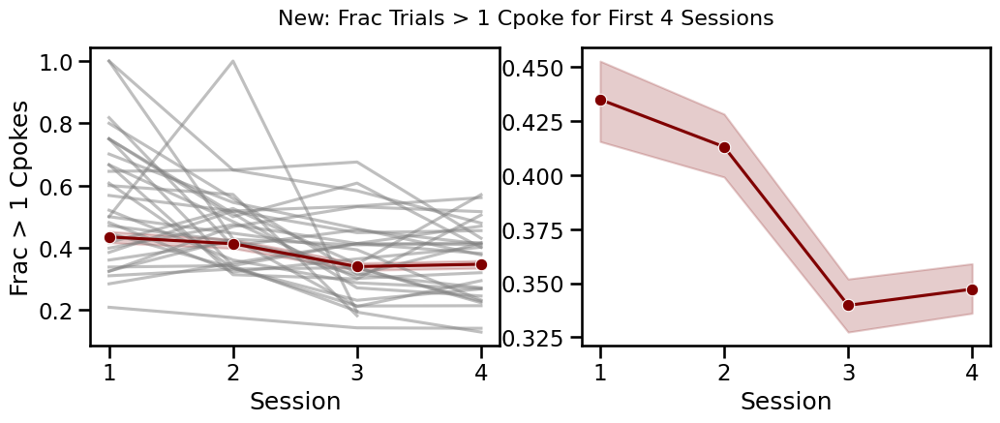

In [67]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))

sns.lineplot(
    data=multi_cpoke_df.query("session < 5 "),
    x="session",
    y="multi_cpoke",
    hue="animal_id",
    palette=(["gray"] * multi_cpoke_df.animal_id.nunique()),
    ax=ax[0],
    alpha=0.5,
    errorbar=None,
    legend=False,
)
for iax in ax:
    sns.lineplot(
        data=multi_cpoke_df.query("session < 5 "),
        x="session",
        y="multi_cpoke",
        ax=iax,
        marker="o",
        color="maroon",
    )
_ = ax[0].set(
    xlabel="Session",
    ylabel="Frac > 1 Cpokes",
)

_ = ax[1].set(
    xlabel="Session",
    ylabel="",
)

fig.suptitle("New: Frac Trials > 1 Cpoke for First 4 Sessions", fontsize=16)

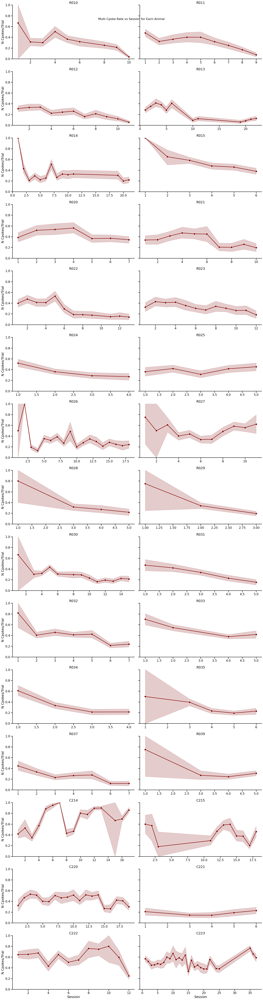

In [65]:
g = sns.FacetGrid(
    multi_cpoke_df,
    col="animal_id",
    col_wrap=2,
    height=5,
    aspect=2,
    sharex=False,
    ylim=(0, 1),
)

# Map the lineplot function to each subset of the data
g.map(
    sns.lineplot,
    "session",
    "multi_cpoke",
    marker="o",
    estimator="mean",
    color="maroon",
)
# Add titles and adjust layout if needed
g.set_titles(col_template="{col_name}")
g.fig.suptitle(
    f"Multi Cpoke Rate vs Session for Each Animal",
    fontsize=16,
)
g.set_axis_labels("Session", "N Cpokes/Trial")

TODO: it would be amazing to merge this mutlicpoke date with stage 8 violtion rates. Have a melted df that is labeled by punished and unpunished and then see how the rate changes. Color it by punishment type. If over time is messy, a box plot with multi cpoke rate (ie violation rate) with and without punishment would be good.

It does not, in fact, seem interesting to compare the multi cpoke rate to the delay length. It drops over time and that is just how it appears to go.

## Violation Rates


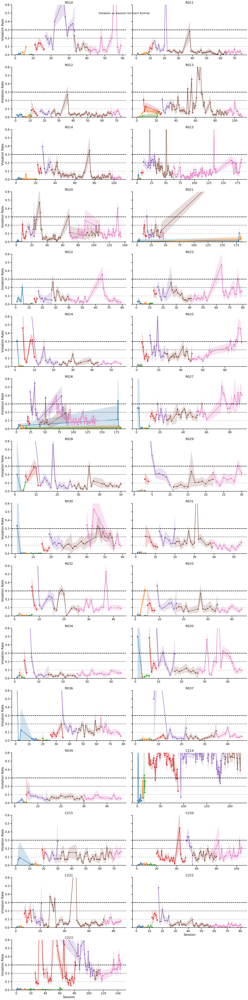

In [200]:
g = sns.FacetGrid(
    tdf,
    col="animal_id",
    col_wrap=2,
    height=5,
    aspect=2,
    sharex=False,
    ylim=(None, 0.6),
    hue="stage",
)

# Map the lineplot function to each subset of the data
g.map(
    sns.lineplot,
    "session",
    "violations",
    marker="o",
    estimator="mean",
)
# Add titles and adjust layout if needed
g.set_titles(col_template="{col_name}")
g.fig.suptitle(
    f"Violation vs Session for Each Animal",
    fontsize=16,
)
g.set_axis_labels("Session", "Violation Rate")

g.map(plt.axhline, y=0.3, color="k", linestyle="--")
g.map(plt.axhline, y=0.2, color="gray", linestyle="--")
g.map(plt.axhline, y=0.1, color="lightgray", linestyle="--")

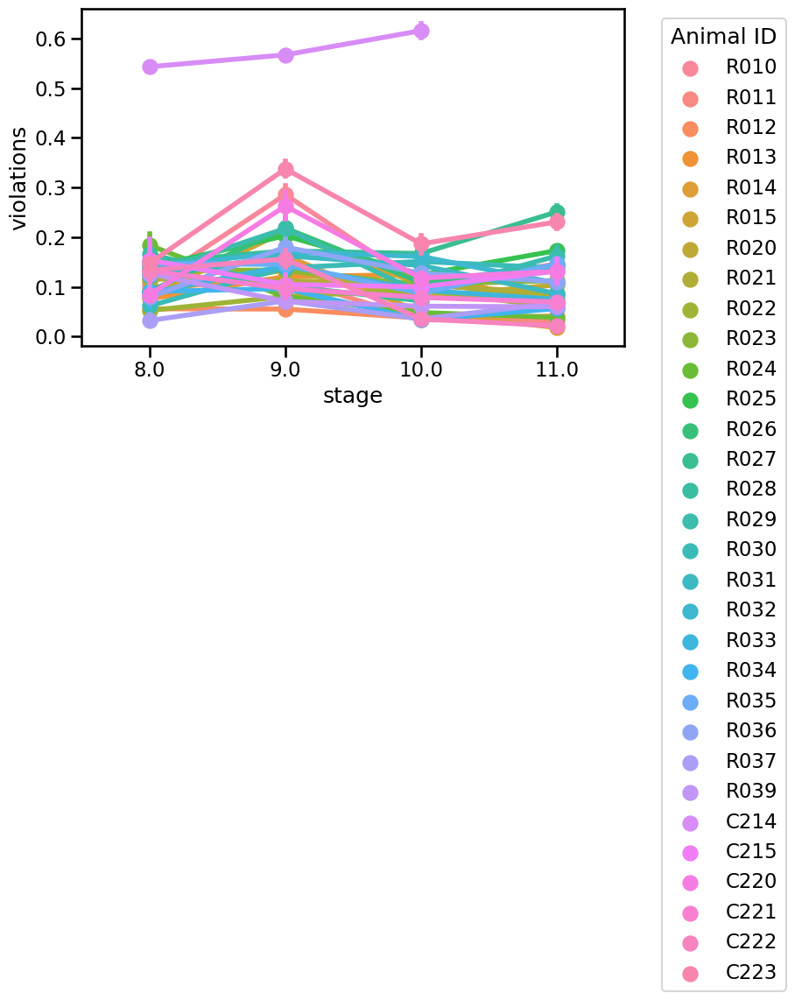

In [210]:
fig, ax = plt.subplots(figsize=(8, 5))

sns.pointplot(
    data=tdf.query("stage >=8"), hue="animal_id", x="stage", y="violations", ax=ax
)

plt.legend(title="Animal ID", bbox_to_anchor=(1.05, 1), loc="upper left")


Dropping C214 from this analysis since they never understood the fixation and were using their hands- should be dropped above. 

(0.0, 1.0)

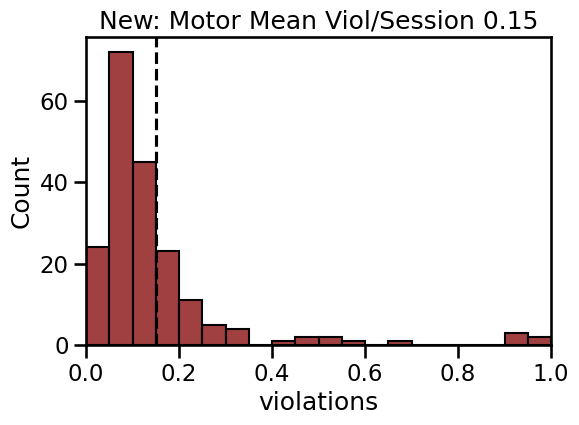

In [159]:
fig, ax = plt.subplots(figsize=(6, 4))
viol_by_session = (
    tdf.query("stage == 8 and animal_id != 'C214'")
    .groupby(["animal_id", "sess_id"])
    .violations.mean()
).reset_index()

sns.histplot(
    data=viol_by_session, x="violations", bins=20, binwidth=0.05, color="maroon", ax=ax
)

mean = viol_by_session.violations.mean()
ax.axvline(mean, color="k", linestyle="--")
plt.title(f"New: Motor Mean Viol/Session {mean:.2f}")
plt.xlim(0, 1)

(0.0, 1.0)

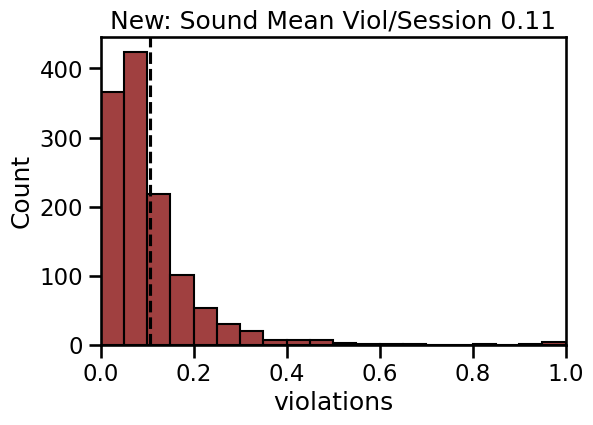

In [160]:
fig, ax = plt.subplots(figsize=(6, 4))

viol_by_session = (
    tdf.query("stage >=10 and animal_id != 'C214'")
    .groupby(["animal_id", "sess_id"])
    .violations.mean()
).reset_index()

sns.histplot(
    data=viol_by_session, x="violations", bins=20, binwidth=0.05, color="maroon", ax=ax
)


mean = viol_by_session.violations.mean()
ax.axvline(mean, color="k", linestyle="--")
plt.title(f"New: Sound Mean Viol/Session {mean:.2f}")
plt.xlim(0, 1)

### Stage 8 Analysis

Lets look at the violation rate over sessions in stage 8- this is when the violation penalty is actually turned on and will be a good indicator for how many days animals need in the "violation penalty" stage of the new curriculum. I will be dropping C214 and C223-both these animals were sent back to stage 8 multiple times and came from pclicks so I don't think they are the best sample for exploring. They simply struggled with the concept of fixation for different reasons and I've stopped training them completely. C214 was using their hands to fixate and C223 was afraid of the 12khZ sound.

In [178]:
animals_to_drop = ["C214", "C223"]
stage8 = tdf.query("stage == 8 and animal_id not in @animals_to_drop").copy()

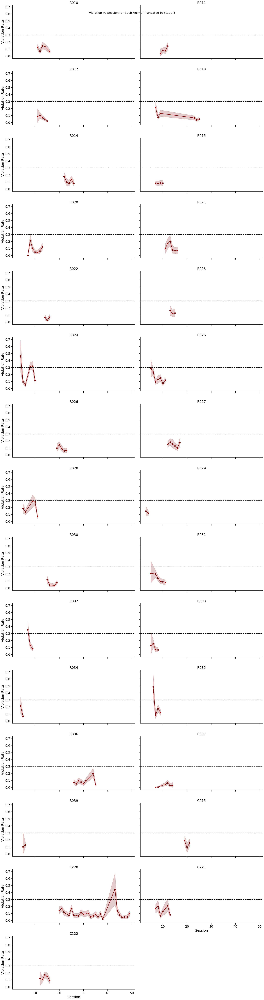

In [196]:
g = sns.FacetGrid(
    stage8,
    col="animal_id",
    col_wrap=2,
    height=5,
    aspect=2,
)

# Map the lineplot function to each subset of the data
g.map(
    sns.lineplot, "session", "violations", marker="o", estimator="mean", color="maroon"
)
# Add titles and adjust layout if needed
g.set_titles(col_template="{col_name}")
g.fig.subplots_adjust(top=0.95)
g.fig.suptitle(
    f"Violation vs Session for Each Animal Truncated in Stage 8",
    fontsize=16,
)
g.set_axis_labels("Session", "Violation Rate")

g.map(plt.axhline, y=0.3, color="k", linestyle="--")

In [179]:
# MAKE A column that is days in stage 8 which counts up from the first day in stage 8

stage8["days_in_stage8"] = stage8.groupby("animal_id")["date_time_date"].transform(
    lambda x: (x - x.min()).dt.days
)

/var/folders/__/8jn6qz211155h1xb451s5zcr0000gn/T/ipykernel_33493/3440849270.py:11: UserWarning: 
The palette list has fewer values (28) than needed (29) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(


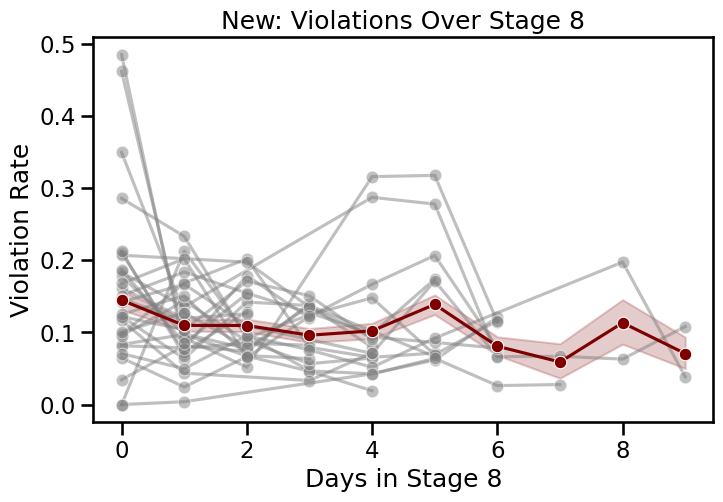

In [193]:
fig, ax = plt.subplots(figsize=(8, 5))
sns.lineplot(
    data=stage8.query("days_in_stage8 < 10"),
    x="days_in_stage8",
    y="violations",
    marker="o",
    color="maroon",
    ax=ax,
    zorder=100,
)
sns.lineplot(
    data=stage8.query("days_in_stage8 < 10"),
    x="days_in_stage8",
    y="violations",
    marker="o",
    hue="animal_id",
    palette=sns.color_palette(["gray"], n_colors=plot_df.animal_id.nunique()),
    errorbar=None,
    ax=ax,
    alpha=0.5,
)

_ = ax.set(
    xlabel="Days in Stage 8",
    ylabel="Violation Rate",
    title="New: Violations Over Stage 8",
)
ax.get_legend().remove()

### Turning on stage 8 penalty analysis

make a df wrt to days in stage 8
- grab the prev 3 days and post 3 days
- for prev 3 days (ie if negative), calculate the multi cpoke rate
- for next 3 days calculate the violation rate
- store both in a column called "fixation_success" and "metric"


In [ ]:
stage8["days_in_stage8"] = stage8.groupby("animal_id")["date_time_date"].transform(
    lambda x: (x - x.min()).dt.days
)  

In [75]:
tdf.columns

Index(['trial', 'animal_id', 'date', 'sess_id', 'hits', 'violations', 'stage',
       'sa', 'sb', 'stimuli_on', 'settling_in_dur', 'legal_cbreak_dur',
       'pre_dur', 'adj_pre_dur', 'stimulus_dur', 'delay_dur', 'post_dur',
       'sb_extra_dur', 'viol_off_dur', 'pre_go_dur', 'sound_pair',
       'give_type_imp', 'give_frac', 'n_settling_ins', 'avg_settling_in',
       'cpoke_dur', 'date_time_date', 'session', 'cumulative_trial',
       'fixation_dur'],
      dtype='object')

In [116]:
penalty_df = tdf.query("stage >= 5 and stage <= 8").copy()

penalty_df["multi_cpoke"] = penalty_df["n_settling_ins"] > 1


def calculate_days_relative_to_stage_8(group):
    first_stage_8 = group.query("stage == 8").date_time_date.min()
    group["days_relative_to_stage_8"] = (group.date_time_date - first_stage_8).dt.days
    return group


penalty_df = (
    penalty_df.groupby("animal_id")
    .apply(calculate_days_relative_to_stage_8)
    .reset_index(drop=True)
)


penalty_df["fixation_metric"] = np.where(
    penalty_df["days_relative_to_stage_8"] < 0,
    penalty_df["multi_cpoke"],
    penalty_df["violations"],
)

penalty_df["penalty_type"] = np.where(
    penalty_df["days_relative_to_stage_8"] < 0, "none", "time out"
)

penalty_df_agg = (
    penalty_df.groupby(["animal_id", "days_relative_to_stage_8"])
    .agg(
        {
            "fixation_metric": "mean",
            "penalty_type": "first",  # Assuming penalty_type is consistent within each group
        }
    )
    .reset_index()
)

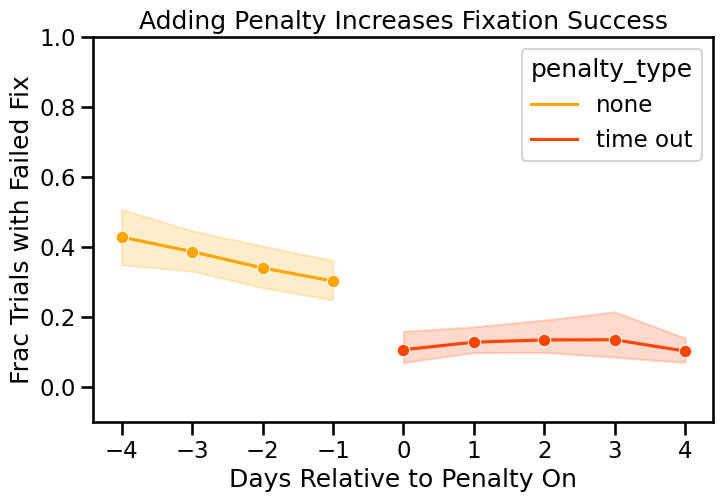

In [127]:
fig, ax = plt.subplots(figsize=(8, 5))

min_day = -4
max_day = 4

plot_df = penalty_df_agg.query(
    "days_relative_to_stage_8 >= @min_day and days_relative_to_stage_8 <= @max_day"
)


sns.lineplot(
    data=plot_df,
    x="days_relative_to_stage_8",
    y="fixation_metric",
    hue="penalty_type",
    palette=["orange", "orangered"],
    marker="o",
    ax=ax,
)

_ = ax.set(
    xlabel="Days Relative to Penalty On",
    ylabel="Frac Trials with Failed Fix",
    title="Adding Penalty Increases Fixation Success",
    ylim=(-0.1, 1),
)

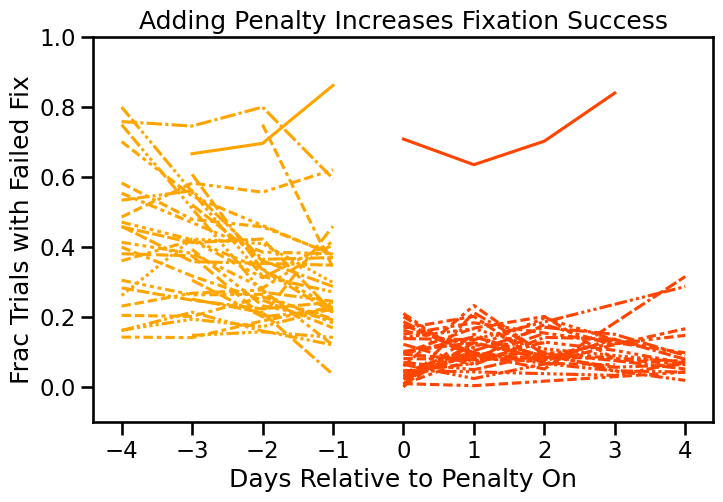

In [125]:
fig, ax = plt.subplots(figsize=(8, 5))


sns.lineplot(
    data=plot_df,
    x="days_relative_to_stage_8",
    y="fixation_metric",
    hue="penalty_type",
    style="animal_id",
    palette=["orange", "orangered"],
    ax=ax,
)

ax.get_legend().remove()

_ = ax.set(
    xlabel="Days Relative to Penalty On",
    ylabel="Frac Trials with Failed Fix",
    title="Adding Penalty Increases Fixation Success",
    ylim=(-0.1, 1),
)

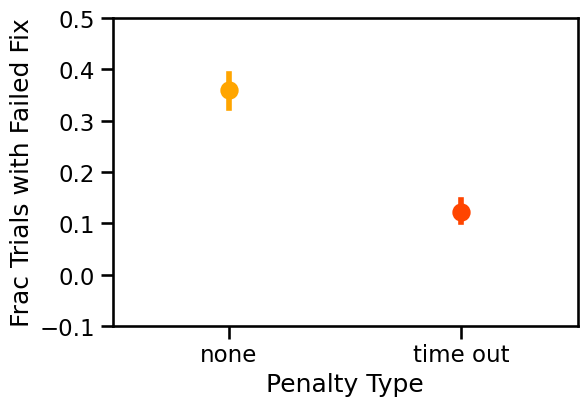

In [139]:
fig, ax = plt.subplots(figsize=(6, 4))

sns.pointplot(
    data=plot_df,
    x="penalty_type",
    y="fixation_metric",
    hue="penalty_type",
    palette=["orange", "orangered"],
    ax=ax,
)

ax.get_legend().remove()

_ = ax.set(
    xlabel="Penalty Type",
    ylabel="Frac Trials with Failed Fix",
    ylim=(-0.1, 0.5),
)

## Days per Stage

In [98]:
stage_summary_df = (
    tdf.groupby(["animal_id", "stage"])
    .session.nunique()
    .reset_index()
    .rename(columns={"session": "days_in_stage"})
)

mean_trial_per_stage = (
    tdf.groupby(["animal_id", "stage", "session"])
    .trial.max()
    .reset_index()
    .groupby(["animal_id", "stage"])
    .trial.mean()
    .reset_index()
    .rename(columns={"trial": "mean_trial"})
)

stage_summary_df = pd.merge(
    stage_summary_df, mean_trial_per_stage, on=["animal_id", "stage"], how="left"
)


def determine_cohort(group):

    # if string contains 'R01' then cohort 1
    if "R01" in group.animal_id.values[0]:
        group["cohort"] = 1
    elif "C" in group.animal_id.values[0]:
        group["cohort"] = 1.5
    elif "R02" in group.animal_id.values[0]:
        group["cohort"] = 2
    elif "R03" in group.animal_id.values[0]:
        group["cohort"] = 3
    else:
        group["cohort"] = -1
    return group


stage_summary_df = (
    stage_summary_df.groupby("animal_id").apply(determine_cohort).reset_index(drop=True)
)
stage_summary_df

,animal_id,stage,days_in_stage,mean_trial,cohort
0,C214,5.0,9,140.333333,1.5
1,C214,6.0,3,192.000000,1.5
2,C214,7.0,4,190.750000,1.5
3,C214,8.0,63,287.031746,1.5
4,C214,9.0,84,216.904762,1.5
...,...,...,...,...,...
210,R039,7.0,1,372.000000,3.0
211,R039,8.0,2,316.500000,3.0
212,R039,9.0,8,254.125000,3.0
213,R039,10.0,16,246.125000,3.0


<Axes: xlabel='stage', ylabel='mean_trial'>

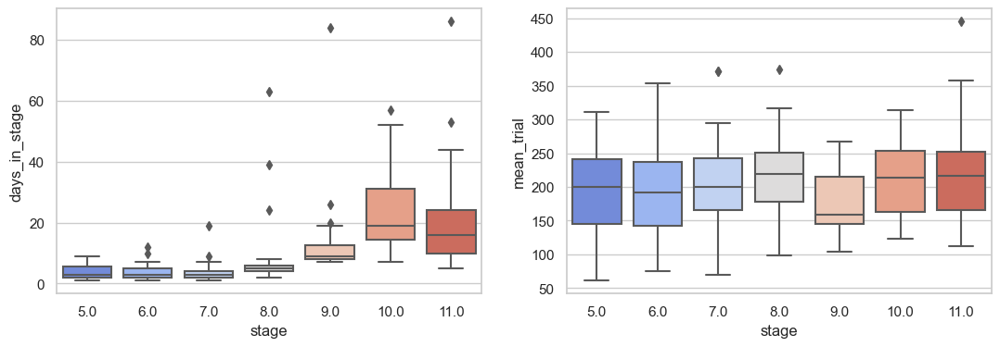

In [99]:
fig, ax = plt.subplots(1, 2, figsize=(13, 4))

sns.boxplot(
    data=stage_summary_df, x="stage", y="days_in_stage", palette="coolwarm", ax=ax[0]
)

sns.boxplot(
    data=stage_summary_df, x="stage", y="mean_trial", palette="coolwarm", ax=ax[1]
)

<Axes: xlabel='stage', ylabel='mean_trial'>

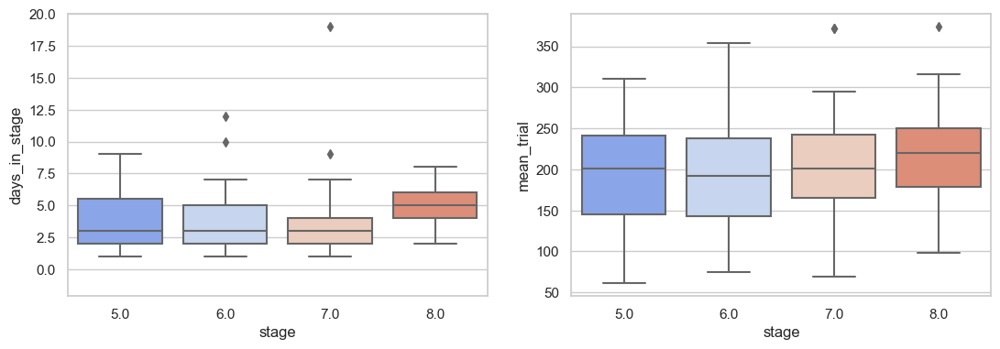

In [100]:
fig, ax = plt.subplots(1, 2, figsize=(13, 4))

stage_max = 9

plot_df = stage_summary_df.query("stage < @stage_max")
sns.boxplot(
    data=plot_df,
    x="stage",
    y="days_in_stage",
    palette="coolwarm",
    ax=ax[0],
)

_ = ax[0].set(ylim=(None, 20))

sns.boxplot(
    data=plot_df,
    x="stage",
    y="mean_trial",
    palette="coolwarm",
    ax=ax[1],
)

<Axes: xlabel='stage', ylabel='mean_trial'>

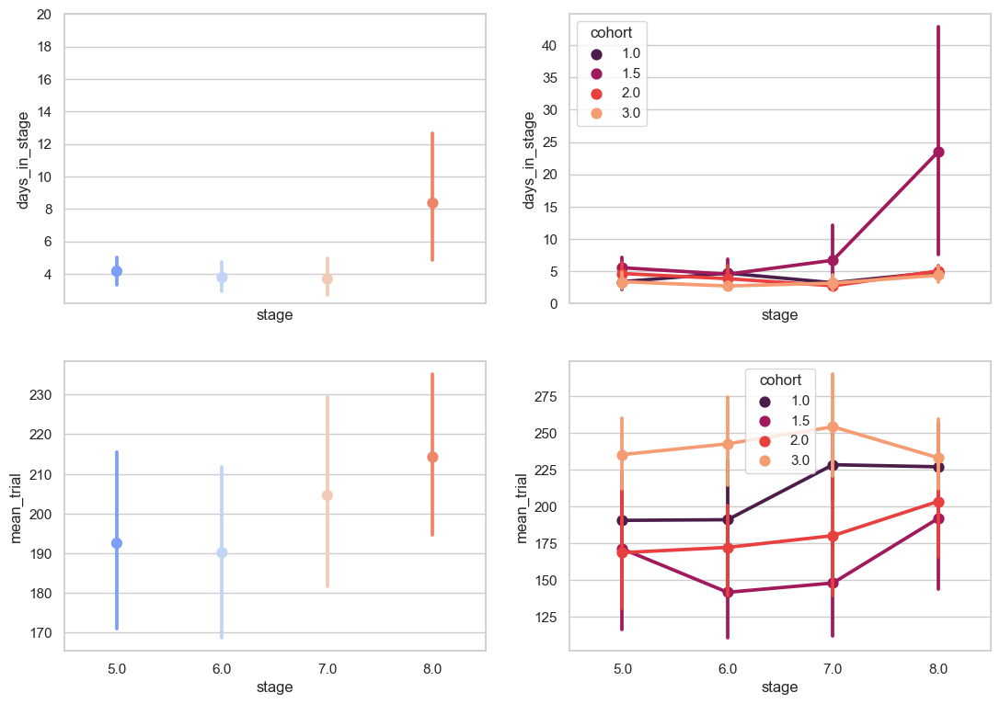

In [101]:
fig, ax = plt.subplots(2, 2, figsize=(13, 9), sharex=True)

stage_max = 9
plot_df = stage_summary_df.query("stage < @stage_max")

sns.pointplot(
    data=plot_df,
    x="stage",
    y="days_in_stage",
    palette="coolwarm",
    ax=ax[0, 0],
)

_ = ax[0, 0].set(ylim=(None, 20))

sns.pointplot(
    data=plot_df,
    x="stage",
    y="days_in_stage",
    palette="rocket",
    hue="cohort",
    ax=ax[0, 1],
)

sns.pointplot(
    data=plot_df,
    x="stage",
    y="mean_trial",
    palette="coolwarm",
    ax=ax[1, 0],
)


sns.pointplot(
    data=plot_df,
    x="stage",
    y="mean_trial",
    palette="rocket",
    hue="cohort",
    ax=ax[1, 1],
)

It appears the pclicks animals (cohort 1.5) are the most variable, lets drop them and see what happens

<Axes: xlabel='stage', ylabel='mean_trial'>

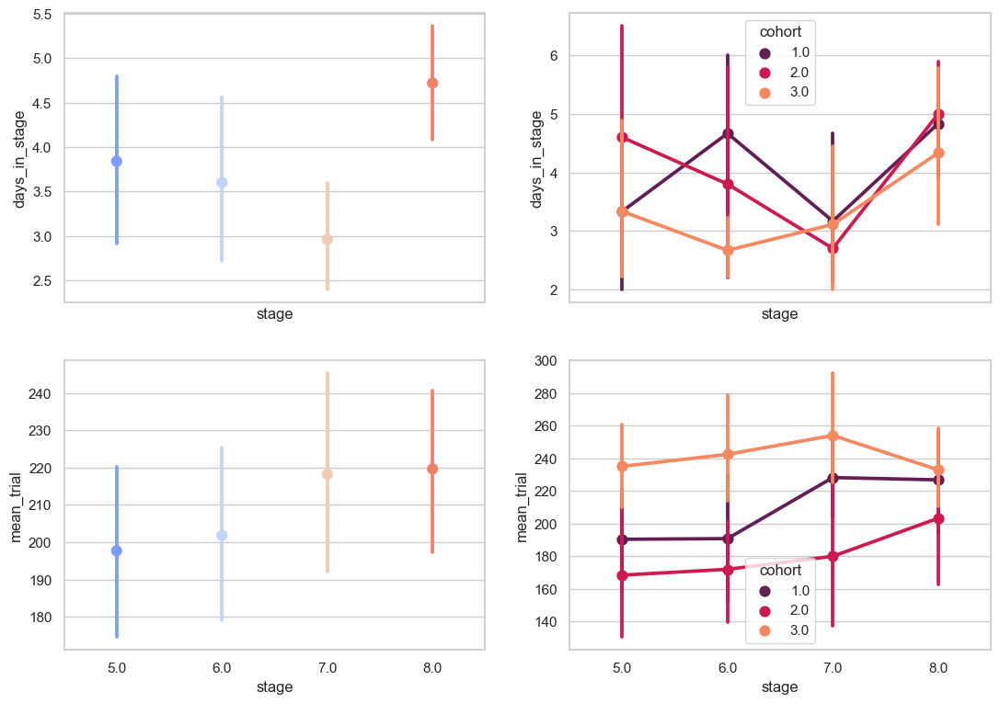

In [102]:
fig, ax = plt.subplots(2, 2, figsize=(13, 9), sharex=True)

stage_max = 9
cohort_drop = 1.5
plot_df = stage_summary_df.query("stage < @stage_max and cohort != @cohort_drop")

sns.pointplot(
    data=plot_df,
    x="stage",
    y="days_in_stage",
    palette="coolwarm",
    ax=ax[0, 0],
)

sns.pointplot(
    data=plot_df,
    x="stage",
    y="days_in_stage",
    palette="rocket",
    hue="cohort",
    ax=ax[0, 1],
)

sns.pointplot(
    data=plot_df,
    x="stage",
    y="mean_trial",
    palette="coolwarm",
    ax=ax[1, 0],
)


sns.pointplot(
    data=plot_df,
    x="stage",
    y="mean_trial",
    palette="rocket",
    hue="cohort",
    ax=ax[1, 1],
)

Things learned from most recent work session:

1. it feels like it is time to wrap these analyses into a power point- shoot by julie meeting in 10 days
2. turning on the penalty has a huge effect! might want to run a second cohort split in half with the penalty on from the beginning and the same two grow types (depending on results of prev cohort)
3. Cohort 1.5 (the pclicks animals) are the most inconsistent when it comes to stage numbers and time. This is not surprising given they mostly failed at another protocol first and speaks to the strength of this curriculum for getting *any* of them through
4. Cohort 1 had slightly lower trial numbers than cohort 3 but overall similar days in stage. it is notable that cohort 3 had different EOD logic (lower trial requirements and smaller ITIs), yet the data is similar. In this light, i'd like to make three more plots. The goal of this would be to ensure that the more lenient EOD logic does not lead to worse performance in violation rates. 
* add cohort number to tdf & re-run code
* look at violation rates (growing and sound rule) by cohort
* look at penalty on by cohort
5. Cohort 2 had the shortest run times so their trial count was lower, however, they still progressed no problem through the stages (ie they weren't in them for a longer amount of days). This supports having EOD logic in the testing group rather than EOS logic so everyone is on a fair playing field assuming the minimum number of trials needed to complete a stage is scaled to the shortest session.




